# Определение стоимости автомобилей

**Описание и цели проекта**:  

Сервис по продаже автомобилей с пробегом «Не бит, не крашен» разрабатывает приложение для привлечения новых клиентов. В нём можно быстро узнать рыночную стоимость своего автомобиля. В вашем распоряжении исторические данные: технические характеристики, комплектации и цены автомобилей. Вам нужно построить модель для определения стоимости. 

Заказчику важны:

- качество предсказания;
- скорость предсказания;
- время обучения.

**Описание данных:**

*Входящие признаки:*

*DateCrawled* — дата скачивания анкеты из базы  
*VehicleType* — тип автомобильного кузова  
*RegistrationYear* — год регистрации автомобиля  
*Gearbox*— тип коробки передач  
*Power* — мощность (л. с.)  
*Model* — модель автомобиля  
*Kilometer* — пробег (км)  
*RegistrationMonth* — месяц регистрации автомобиля  
*FuelType* — тип топлива  
*Brand* — марка автомобиля  
*Repaired* — была машина в ремонте или нет  
*DateCreated* — дата создания анкеты  
*NumberOfPictures* — количество фотографий автомобиля  
*PostalCode* — почтовый индекс владельца анкеты (пользователя)  
*LastSeen* — дата последней активности пользователя  


*Целевой признак:*

*Price* — цена (евро)

**План работы:**

1. Подготовка данных 
2. Обучение моделей
3. Анализ моделей
4. Общие выводы

## Подготовка данных

Загрузим библиотеки, необходимые для выполнения исследования:

In [38]:
!pip install matplotlib==3.5.0 -q
!pip install -Uq scikit-learn

In [39]:
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
! pip install phik
import phik
from phik import phik_matrix
from phik.report import plot_correlation_matrix
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, cross_val_score 
from sklearn.preprocessing import (
    OneHotEncoder, OrdinalEncoder, LabelEncoder,
    StandardScaler, MinMaxScaler, RobustScaler
)
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge, RidgeCV
from sklearn.linear_model import SGDRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import RandomForestRegressor
from catboost import CatBoostRegressor
! pip install lightgbm
from lightgbm import LGBMRegressor
from sklearn.pipeline import Pipeline

from tqdm import tqdm

Определим необходимые константные величины:

In [40]:
RANDOM_STATE = 12345

Выполним загрузку исследуемых данных:

In [41]:
try:
    
    df = pd.read_csv('/home/pc-mint/Загрузки/Autos_project/autos.csv')

except:
    
    df = pd.read_csv('/datasets/autos.csv')

Выведем первые 5 строк загруженного датасета:

In [42]:
df.head()

,DateCrawled,Price,VehicleType,RegistrationYear,Gearbox,Power,Model,Kilometer,RegistrationMonth,FuelType,Brand,Repaired,DateCreated,NumberOfPictures,PostalCode,LastSeen
0,2016-03-24 11:52:17,480,NaN,1993,manual,0,golf,150000,0,petrol,volkswagen,NaN,2016-03-24 00:00:00,0,70435,2016-04-07 03:16:57
1,2016-03-24 10:58:45,18300,coupe,2011,manual,190,NaN,125000,5,gasoline,audi,yes,2016-03-24 00:00:00,0,66954,2016-04-07 01:46:50
2,2016-03-14 12:52:21,9800,suv,2004,auto,163,grand,125000,8,gasoline,jeep,NaN,2016-03-14 00:00:00,0,90480,2016-04-05 12:47:46
3,2016-03-17 16:54:04,1500,small,2001,manual,75,golf,150000,6,petrol,volkswagen,no,2016-03-17 00:00:00,0,91074,2016-03-17 17:40:17
4,2016-03-31 17:25:20,3600,small,2008,manual,69,fabia,90000,7,gasoline,skoda,no,2016-03-31 00:00:00,0,60437,2016-04-06 10:17:21


Данные загружены корректно.

Выведем общую информацию о датасете:

In [43]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 354369 entries, 0 to 354368
Data columns (total 16 columns):
 #   Column             Non-Null Count   Dtype 
---  ------             --------------   ----- 
 0   DateCrawled        354369 non-null  object
 1   Price              354369 non-null  int64 
 2   VehicleType        316879 non-null  object
 3   RegistrationYear   354369 non-null  int64 
 4   Gearbox            334536 non-null  object
 5   Power              354369 non-null  int64 
 6   Model              334664 non-null  object
 7   Kilometer          354369 non-null  int64 
 8   RegistrationMonth  354369 non-null  int64 
 9   FuelType           321474 non-null  object
 10  Brand              354369 non-null  object
 11  Repaired           283215 non-null  object
 12  DateCreated        354369 non-null  object
 13  NumberOfPictures   354369 non-null  int64 
 14  PostalCode         354369 non-null  int64 
 15  LastSeen           354369 non-null  object
dtypes: int64(7), object(

Как видно из таблицы выше, данные имеют пропуски в столбцах VehicleType, Gearbox, Model, FuelType, Repaired. Также столбцы DateCrawled, DateCreated и LastSeen содержащие даты и время, загружены как строки.

Рассмотрим какие уникальные значенния содержит столбец **VehicleType**

In [44]:
df['VehicleType'].unique()

array([nan, 'coupe', 'suv', 'small', 'sedan', 'convertible', 'bus',
       'wagon', 'other'], dtype=object)

In [45]:
df['VehicleType'].isna().sum()

37490

Попробуем восстановить часть отсутствующих данных о типе кузова автомобиля, следующим образом: для объекта с отстутствующим значением 'Vehicletype' будем находить объекты такого же бренда, модели и с таким же количеством лошадиных сил, у которых значение 'VehicleType' заполнено. Его и примем в качестве замены. В случае если у отобранных таким образом объектов будет несколько значений параметра 'VehicleType', булем принимать самое распространенное. Прежде чем приступить к данной задаче, обработаем пропуски и аномалии в столбцах 'Model' и 'Power', чтобы процесс восстановления проходил по обработанным данным:

Рассмотрим какие уникальные значенния содержит столбец **Brand**, для этого воспользуемся функцией:

In [46]:
def count_graph(df, col, name, a, b):
    fig, ax = plt.subplots(figsize=(a,b))
    ax = sns.countplot(y=df[col],
         order=df[col].value_counts(ascending=False).index);
    abs_values = df[col].value_counts(ascending=False).values
    ax.bar_label(container=ax.containers[0], labels=abs_values)
    ax.set_title(name);

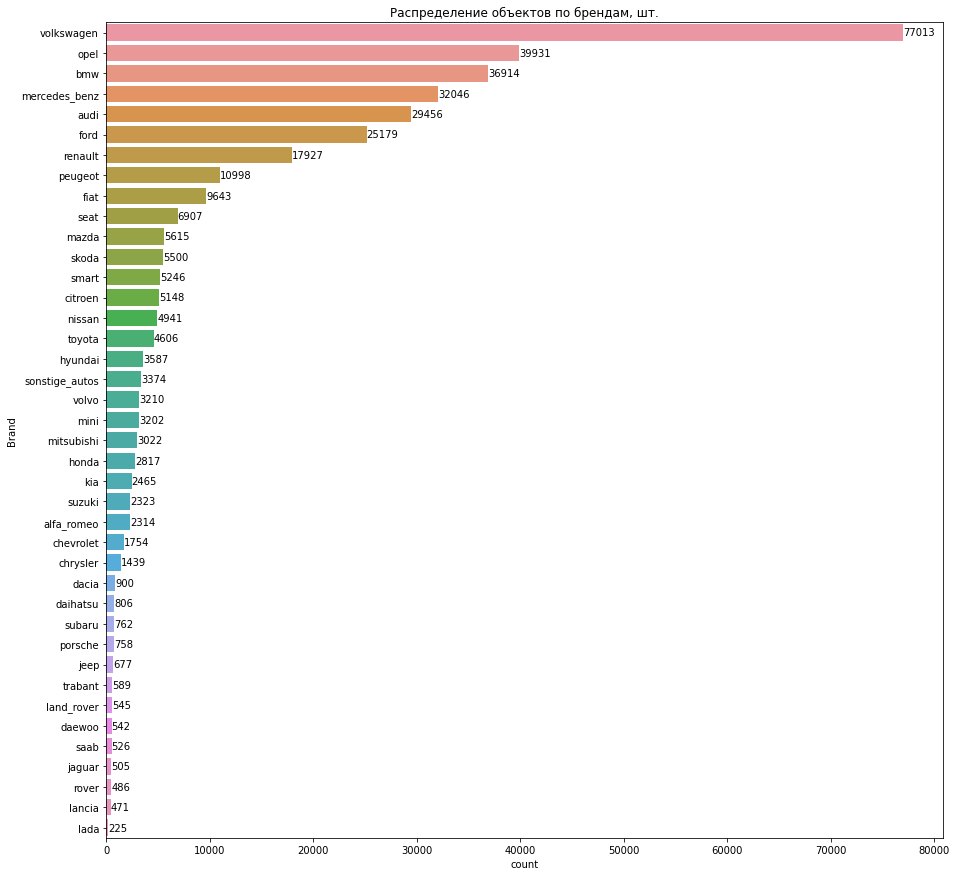

In [47]:
count_graph(df, 'Brand', 'Распределение объектов по брендам, шт.', 15, 15)

Как видно из списка выше, в столбце Brand имеется значение 'sonstige_autos', что в переводе с немецкого означает "другие автомобили". Рассмотрим  из себя представляют объекты, содержащие такое значение:

In [48]:
df[df['Brand'] == 'sonstige_autos'].head(10)

,DateCrawled,Price,VehicleType,RegistrationYear,Gearbox,Power,Model,Kilometer,RegistrationMonth,FuelType,Brand,Repaired,DateCreated,NumberOfPictures,PostalCode,LastSeen
59,2016-03-29 15:48:15,1,suv,1994,manual,286,NaN,150000,11,NaN,sonstige_autos,NaN,2016-03-29 00:00:00,0,53721,2016-04-06 01:44:38
306,2016-03-21 14:38:37,200,NaN,2009,NaN,0,NaN,10000,0,NaN,sonstige_autos,NaN,2016-03-21 00:00:00,0,6493,2016-03-24 02:47:34
431,2016-03-20 20:45:27,3950,small,2004,auto,5,NaN,70000,5,gasoline,sonstige_autos,no,2016-03-20 00:00:00,0,90562,2016-04-03 04:17:08
650,2016-03-30 11:55:46,15000,coupe,1971,NaN,0,NaN,5000,4,NaN,sonstige_autos,no,2016-03-30 00:00:00,0,51145,2016-04-07 02:45:10
661,2016-04-01 15:56:27,9900,suv,2000,auto,250,NaN,150000,4,lpg,sonstige_autos,no,2016-04-01 00:00:00,0,17309,2016-04-07 14:56:03
700,2016-03-30 21:37:21,6999,sedan,2010,auto,186,NaN,125000,4,petrol,sonstige_autos,no,2016-03-30 00:00:00,0,81929,2016-04-05 11:18:33
985,2016-03-15 16:37:22,500,sedan,2010,manual,101,NaN,70000,1,petrol,sonstige_autos,yes,2016-03-15 00:00:00,0,76829,2016-03-21 14:15:21
999,2016-04-02 23:39:49,3900,wagon,1990,manual,0,NaN,30000,5,petrol,sonstige_autos,NaN,2016-04-02 00:00:00,0,15345,2016-04-07 01:46:23
1098,2016-03-06 22:43:51,11500,bus,1985,auto,160,NaN,125000,10,petrol,sonstige_autos,NaN,2016-03-06 00:00:00,0,4849,2016-04-05 18:17:04
1106,2016-03-22 11:38:37,9200,sedan,2005,auto,249,NaN,150000,10,petrol,sonstige_autos,no,2016-03-22 00:00:00,0,95447,2016-04-05 23:16:55


Выясним какой процент от общего количества автомобилей занимают рассматриваемые объекты:

In [49]:
df[df['Brand'] == 'sonstige_autos'].shape[0] / df.shape[0] * 100

0.9521148858957752

Кака видно из таблицы выше, объекты содержащие в столбце 'Brand' значение sonstige_autos, имеют большое количество пропусков, аномальных значений (как Power = 0), при этом данный столбец не обладает полезной обобщающей способностью для нашей модели, т.к. явно к нему относили объекты, которые по какой то причине не могли нормально классифицировать. Ввиду того что такие объекты составляют менее 1% от общей выборки и не несут полезной для обучения модели информации, предлагается их удалить.

In [50]:
df = df[df['Brand'] != 'sonstige_autos']

Проверим что удаление объектов прошло успешно:

In [51]:
sorted(df['Brand'].unique())

['alfa_romeo',
 'audi',
 'bmw',
 'chevrolet',
 'chrysler',
 'citroen',
 'dacia',
 'daewoo',
 'daihatsu',
 'fiat',
 'ford',
 'honda',
 'hyundai',
 'jaguar',
 'jeep',
 'kia',
 'lada',
 'lancia',
 'land_rover',
 'mazda',
 'mercedes_benz',
 'mini',
 'mitsubishi',
 'nissan',
 'opel',
 'peugeot',
 'porsche',
 'renault',
 'rover',
 'saab',
 'seat',
 'skoda',
 'smart',
 'subaru',
 'suzuki',
 'toyota',
 'trabant',
 'volkswagen',
 'volvo']

Рассмотрим какие уникальные значенния содержит столбец **Model**:

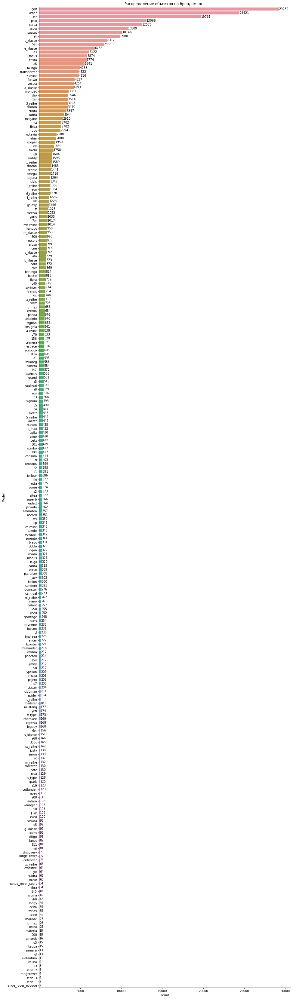

In [52]:
count_graph(df, 'Model', 'Распределение объектов по брендам, шт.', 15, 60)

Обратим внимание на тот факт, что автомобили со значением модели 'other' стали самой распространенной "моделью"

Ввиду того, что восстановление модели автомобиля по имеющимся данным частично возможно, но крайне трудоемко, отнесем объекты, имеющие пропуски в столбце Model к категории 'other'

In [53]:
df['Model'] = df['Model'].fillna('other')

Проверим что замена прошла успешно:

In [54]:
sorted(df['Model'].unique())

['100',
 '145',
 '147',
 '156',
 '159',
 '1_reihe',
 '1er',
 '200',
 '2_reihe',
 '300c',
 '3_reihe',
 '3er',
 '4_reihe',
 '500',
 '5_reihe',
 '5er',
 '601',
 '6_reihe',
 '6er',
 '7er',
 '80',
 '850',
 '90',
 '900',
 '9000',
 '911',
 'a1',
 'a2',
 'a3',
 'a4',
 'a5',
 'a6',
 'a8',
 'a_klasse',
 'accord',
 'agila',
 'alhambra',
 'almera',
 'altea',
 'amarok',
 'antara',
 'arosa',
 'astra',
 'auris',
 'avensis',
 'aveo',
 'aygo',
 'b_klasse',
 'b_max',
 'beetle',
 'berlingo',
 'bora',
 'boxster',
 'bravo',
 'c1',
 'c2',
 'c3',
 'c4',
 'c5',
 'c_klasse',
 'c_max',
 'c_reihe',
 'caddy',
 'calibra',
 'captiva',
 'carisma',
 'carnival',
 'cayenne',
 'cc',
 'ceed',
 'charade',
 'cherokee',
 'citigo',
 'civic',
 'cl',
 'clio',
 'clk',
 'clubman',
 'colt',
 'combo',
 'cooper',
 'cordoba',
 'corolla',
 'corsa',
 'cr_reihe',
 'croma',
 'crossfire',
 'cuore',
 'cx_reihe',
 'defender',
 'delta',
 'discovery',
 'doblo',
 'ducato',
 'duster',
 'e_klasse',
 'elefantino',
 'eos',
 'escort',
 'espace',
 

Также, обратим внимание, что в списке моделей имеются неявные дубликаты 'range_rover' и 'rangerover'. Если мы выведем все объекты, содержащие наименование 'rangerover', то увидим что эти объекты относятся к бренду Rover, тогда как наименование 'range_rover' относится к бренду Land Rover. Т.к. у брендов Land Rover и Rover сложная история взаимного подчинения, оставим распределение марок и моделей между нами таким, какое оно есть. 

In [55]:
df.query('Model == "rangerover"')

,DateCrawled,Price,VehicleType,RegistrationYear,Gearbox,Power,Model,Kilometer,RegistrationMonth,FuelType,Brand,Repaired,DateCreated,NumberOfPictures,PostalCode,LastSeen
27949,2016-03-18 01:57:30,1050,small,1998,manual,103,rangerover,150000,10,petrol,rover,NaN,2016-03-18 00:00:00,0,49084,2016-04-05 21:18:19
117409,2016-03-24 08:54:10,16900,other,2007,auto,190,rangerover,150000,7,gasoline,rover,no,2016-03-24 00:00:00,0,67549,2016-04-06 23:45:08
169654,2016-03-27 21:49:44,2500,suv,1996,manual,0,rangerover,150000,0,gasoline,rover,no,2016-03-27 00:00:00,0,16552,2016-03-27 22:42:26
279463,2016-03-30 15:39:17,3300,NaN,2017,manual,135,rangerover,150000,2,gasoline,rover,no,2016-03-30 00:00:00,0,15374,2016-04-07 06:15:39


In [56]:
df.query('Model == "range_rover"')

,DateCrawled,Price,VehicleType,RegistrationYear,Gearbox,Power,Model,Kilometer,RegistrationMonth,FuelType,Brand,Repaired,DateCreated,NumberOfPictures,PostalCode,LastSeen
5615,2016-03-20 11:43:28,14900,suv,1993,auto,182,range_rover,150000,11,petrol,land_rover,no,2016-03-20 00:00:00,0,10781,2016-04-06 08:46:41
22356,2016-03-22 13:49:59,2800,suv,1996,auto,224,range_rover,150000,1,NaN,land_rover,no,2016-03-22 00:00:00,0,59075,2016-04-06 02:45:52
26526,2016-03-05 17:56:02,5600,suv,1982,manual,125,range_rover,5000,5,petrol,land_rover,NaN,2016-03-02 00:00:00,0,52068,2016-04-06 04:16:41
32216,2016-04-05 00:39:33,14950,suv,1994,auto,182,range_rover,150000,7,petrol,land_rover,no,2016-04-04 00:00:00,0,34123,2016-04-07 08:15:37
33834,2016-03-22 00:40:08,0,suv,1996,auto,224,range_rover,150000,2,petrol,land_rover,yes,2016-03-21 00:00:00,0,21217,2016-03-28 22:47:52
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
331660,2016-03-13 10:42:51,16995,suv,2007,auto,272,range_rover,150000,4,gasoline,land_rover,no,2016-03-13 00:00:00,0,24360,2016-04-06 15:15:27
340882,2016-04-04 08:54:34,1500,NaN,1995,auto,224,range_rover,150000,12,petrol,land_rover,NaN,2016-04-04 00:00:00,0,63920,2016-04-06 09:45:48
344294,2016-03-08 14:54:18,3500,suv,1997,manual,136,range_rover,150000,1,gasoline,land_rover,no,2016-03-08 00:00:00,0,88400,2016-04-06 08:46:32
345351,2016-03-21 16:52:07,10999,suv,2004,auto,286,range_rover,150000,11,petrol,land_rover,no,2016-03-21 00:00:00,0,20251,2016-04-06 16:46:21


Обратим внимание на тот факт, что автомобили со значением модели 'other' стали самой  распространенной "моделью"

Рассмотрим распределение  признака **Power**, для этого будем использовать функцию ниже:

In [57]:
def num_stat_and_graph(df, col, n, title):
    stat = df[col].describe()
    fig, axes = plt.subplots(1,2, figsize=(15,5))
    sns.histplot(df[col], bins=n, ax=axes[0])
    sns.boxplot(data=df, x=col)
    fig.suptitle(title);
    return stat

count    350995.000000
mean        110.267585
std         189.080453
min           0.000000
25%          69.000000
50%         105.000000
75%         142.000000
max       20000.000000
Name: Power, dtype: float64

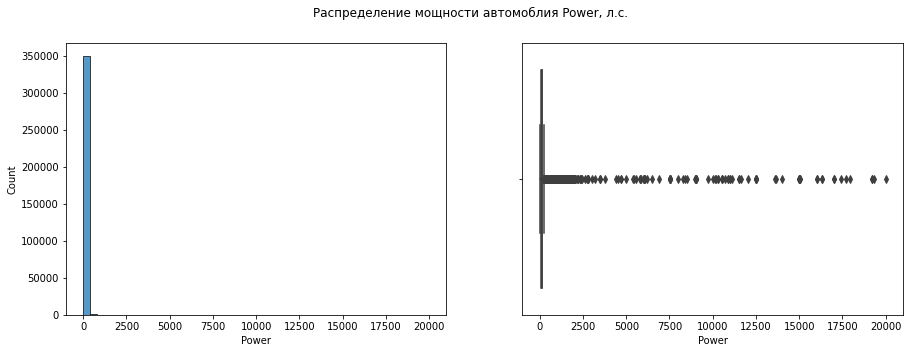

In [58]:
num_stat_and_graph(df, 'Power', 50, 'Распределение мощности автомоблия Power, л.с.')

Как видно из таблицы и на графиках выше, в столбце 'Power' имеются значения 0, что является аномалией, так как мощность машины не может быть нулевой, также в столбце имеются экстремально большие значения, более 1000 л.с., что является очень большой редкостью и скорее всего данные значения получены ввиду ошибок при вводе, лтбо из за технического сбоя.

Рассмотрим какое количество автомобилей имеет мощность равную 0 и посмотрим что это за автомобили:

In [59]:
df[df['Power'] == 0].shape[0]

38837

In [60]:
df[df['Power'] == 0].head(10)

,DateCrawled,Price,VehicleType,RegistrationYear,Gearbox,Power,Model,Kilometer,RegistrationMonth,FuelType,Brand,Repaired,DateCreated,NumberOfPictures,PostalCode,LastSeen
0,2016-03-24 11:52:17,480,NaN,1993,manual,0,golf,150000,0,petrol,volkswagen,NaN,2016-03-24 00:00:00,0,70435,2016-04-07 03:16:57
15,2016-03-11 21:39:15,450,small,1910,NaN,0,ka,5000,0,petrol,ford,NaN,2016-03-11 00:00:00,0,24148,2016-03-19 08:46:47
32,2016-03-15 20:59:01,245,sedan,1994,NaN,0,golf,150000,2,petrol,volkswagen,no,2016-03-15 00:00:00,0,44145,2016-03-17 18:17:43
37,2016-03-28 17:50:15,1500,NaN,2016,NaN,0,kangoo,150000,1,gasoline,renault,no,2016-03-28 00:00:00,0,46483,2016-03-30 09:18:02
40,2016-03-26 22:06:17,0,NaN,1990,NaN,0,corsa,150000,1,petrol,opel,NaN,2016-03-26 00:00:00,0,56412,2016-03-27 17:43:34
54,2016-03-17 07:56:40,4700,wagon,2005,manual,0,signum,150000,0,NaN,opel,no,2016-03-17 00:00:00,0,88433,2016-04-04 04:17:32
55,2016-03-26 10:39:35,550,wagon,1999,manual,0,astra,150000,8,gasoline,opel,yes,2016-03-26 00:00:00,0,56759,2016-04-01 23:17:27
69,2016-04-01 11:56:40,1200,coupe,2001,NaN,0,astra,150000,0,NaN,opel,NaN,2016-04-01 00:00:00,0,47249,2016-04-07 08:46:07
70,2016-03-08 01:36:42,800,small,1993,manual,0,polo,150000,3,petrol,volkswagen,no,2016-03-08 00:00:00,0,8258,2016-04-05 23:46:00
90,2016-03-23 11:53:21,2400,sedan,2003,manual,0,a4,150000,9,gasoline,audi,NaN,2016-03-23 00:00:00,0,40210,2016-03-23 11:53:21


Посмотрим, какое количество автомобилей имеет мощность менее 10 л.с., но при этом не является нулевым значением:

In [61]:
df[(df['Power'] < 10) & (df['Power'] != 0)].shape[0]

76

In [62]:
pd.set_option('display.max_rows', None)
df[(df['Power'] < 10) & (df['Power'] != 0)]

,DateCrawled,Price,VehicleType,RegistrationYear,Gearbox,Power,Model,Kilometer,RegistrationMonth,FuelType,Brand,Repaired,DateCreated,NumberOfPictures,PostalCode,LastSeen
3349,2016-03-29 17:37:58,1990,small,2004,NaN,7,polo,150000,5,gasoline,volkswagen,no,2016-03-29 00:00:00,0,37124,2016-04-02 05:16:40
9561,2016-04-04 07:58:34,9000,sedan,2009,manual,2,a4,5000,12,gasoline,audi,NaN,2016-04-04 00:00:00,0,12045,2016-04-06 10:17:01
20229,2016-03-17 22:48:49,4999,sedan,2003,manual,1,e_klasse,150000,12,gasoline,mercedes_benz,NaN,2016-03-17 00:00:00,0,66571,2016-03-17 23:44:50
30919,2016-03-24 18:47:46,1500,bus,2003,auto,2,other,150000,10,gasoline,hyundai,NaN,2016-03-24 00:00:00,0,40789,2016-03-26 04:15:35
33068,2016-03-29 15:44:33,5950,small,2004,manual,4,golf,80000,7,petrol,volkswagen,no,2016-03-29 00:00:00,0,64285,2016-04-06 01:15:51
33223,2016-03-23 12:55:57,3900,convertible,2004,auto,1,forfour,90000,5,petrol,smart,no,2016-03-23 00:00:00,0,85386,2016-04-05 12:45:16
33995,2016-04-02 20:54:41,4999,small,2012,auto,5,other,5000,10,electric,renault,no,2016-04-02 00:00:00,0,38315,2016-04-06 22:16:21
34378,2016-03-18 19:45:27,655,NaN,1995,manual,5,other,70000,0,NaN,seat,NaN,2016-03-18 00:00:00,0,66459,2016-03-18 19:45:27
37733,2016-03-23 21:56:02,1300,wagon,1999,auto,9,other,30000,3,petrol,citroen,no,2016-03-23 00:00:00,0,79102,2016-04-06 04:17:13
41043,2016-03-11 20:59:13,0,NaN,2016,manual,1,ibiza,150000,0,petrol,seat,NaN,2016-03-11 00:00:00,0,42277,2016-03-19 09:16:08


Как видно из таблицы выше, большей частью такие значения тоже являются аномалией, т.к. автомобилей Volkswagen Polo мощностью 7 л.с. (индекс 3349 в таблице выше) или Audi A4 мощностью 2 л.с.(индекс 9561) никогда не выпускалось/

Рассмотрим сколько объектов имеет мощность более 600 л.с. (в отметку 500+ еще попадают реально существующие Mercedes S-class и Porsche Cayenne) и что они из себя представляют, т.к. машины с такой мощностью встречаются крайне редко:

In [63]:
df[(df['Power'] > 600)].shape[0]

375

In [64]:
pd.set_option('display.max_rows', None)
df[(df['Power'] > 600)]

,DateCrawled,Price,VehicleType,RegistrationYear,Gearbox,Power,Model,Kilometer,RegistrationMonth,FuelType,Brand,Repaired,DateCreated,NumberOfPictures,PostalCode,LastSeen
1816,2016-03-22 20:52:00,3200,small,2004,manual,1398,corolla,5000,6,petrol,toyota,no,2016-03-22 00:00:00,0,22043,2016-03-22 21:43:26
2102,2016-03-21 11:55:22,0,sedan,1999,NaN,1799,vectra,150000,1,petrol,opel,yes,2016-03-21 00:00:00,0,1723,2016-04-04 04:49:06
3746,2016-03-21 14:48:31,0,NaN,2017,manual,750,other,150000,8,petrol,smart,no,2016-03-21 00:00:00,0,49356,2016-03-24 03:44:59
4060,2016-04-03 20:31:00,3100,sedan,2005,manual,953,colt,150000,4,gasoline,mitsubishi,no,2016-04-03 00:00:00,0,60326,2016-04-07 14:56:46
5328,2016-03-29 19:44:48,500,wagon,1999,manual,1001,astra,150000,7,petrol,opel,NaN,2016-03-29 00:00:00,0,33154,2016-04-06 05:44:36
6296,2016-03-31 23:50:47,599,small,2002,manual,603,matiz,5000,11,petrol,chevrolet,yes,2016-03-31 00:00:00,0,44379,2016-04-01 03:41:52
6504,2016-03-14 15:54:34,3000,small,2009,manual,771,punto,125000,0,petrol,fiat,NaN,2016-03-14 00:00:00,0,40721,2016-03-14 15:54:34
6637,2016-03-31 19:48:22,600,small,1996,manual,603,corsa,150000,8,petrol,opel,yes,2016-03-31 00:00:00,0,70327,2016-04-06 14:17:51
7661,2016-04-02 19:25:25,1499,small,1999,manual,7515,lupo,150000,4,petrol,volkswagen,NaN,2016-04-02 00:00:00,0,65830,2016-04-06 11:46:49
7720,2016-04-02 11:48:54,1500,small,2000,manual,1400,other,150000,0,petrol,honda,NaN,2016-04-02 00:00:00,0,21509,2016-04-04 09:15:26


In [65]:
pd.reset_option('display.max_rows')

Заменим данные аномальные значения на медианные значения мощности модели автомобиля:

In [66]:
for d in df['Model'].unique():
    df.loc[(df['Model'] == d) & (df['Power'] > 600) | (df['Power'] < 10) , 'Power'] = \
    df.loc[(df['Model'] == d), 'Power'].median()

Проверим, что замена выполнена корректно:

count    350995.000000
mean        117.212916
std          51.007111
min          10.000000
25%          83.000000
50%         105.000000
75%         141.000000
max         600.000000
Name: Power, dtype: float64

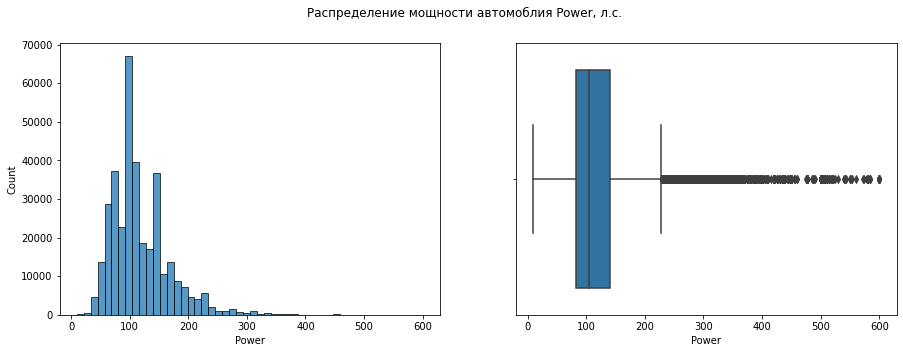

In [67]:
num_stat_and_graph(df, 'Power', 50, 'Распределение мощности автомоблия Power, л.с.')

Как видно из графика выше, околонулевые значения были заменены, также был сокращен "хвост" объекьов с аномально высокой мощностью

Вернемся к пропускам в столбце **VehicleType**. Сгруппируем данные по параметрам 'Brand', 'Model' и 'Power'. Посчитаем количество каждого типа кузовов для сгруппированных объектов:

In [68]:
VTypeCount = (df
              .groupby(['Brand', 'Model', 'Power', 'VehicleType'])
              .agg({'Kilometer': 'count'})
              .rename(columns={'Kilometer':'total'})
             )

In [69]:
VTypeCount.head()

total
Brand      Model Power VehicleType       
alfa_romeo 145   66.0  small            1
                 72.0  small            1
                 90.0  sedan            1
                 95.0  coupe            1
                       sedan            1

Найдем самый распространенный тип кузова для каждого уникального сочетания параметров Brand Model Power, встречающиеся у рассматриваемых объектов

In [70]:
VTypeCountMax = (VTypeCount.loc[VTypeCount.groupby(['Brand', 'Model', 'Power'])['total']
                   .idxmax(skipna=True)]
                   .sort_values(by='total', ascending=False)
                   .reset_index()
                  )

In [71]:
VTypeCountMax.head(10)

,Brand,Model,Power,VehicleType,total
0,volkswagen,golf,75.0,sedan,3329
1,volkswagen,polo,60.0,small,2330
2,volkswagen,golf,105.0,sedan,1838
3,opel,corsa,60.0,small,1802
4,renault,twingo,58.0,small,1623
5,volkswagen,passat,140.0,wagon,1578
6,volkswagen,polo,75.0,small,1361
7,ford,fiesta,60.0,small,1225
8,opel,corsa,75.0,small,1201
9,volkswagen,golf,101.0,sedan,1191


Чтобы упростить читаемость кода, добавим в основной датасет, а также к таблице с самыми распространенными типами кузовов, параметр 'Brand_Model_Power', который является конкатенированной строкой из соответствующих строковых значений столбцов. После выполнения всех необходимых операций по восстановлению удалим этот вспомогательный параметр из основного датасета.

In [72]:
VTypeCountMax['Brand_Model_Power'] = VTypeCountMax["Brand"].astype('str') +\
                                     VTypeCountMax["Model"].astype('str') +\
                                     VTypeCountMax["Power"].astype('str')

In [73]:
df['Brand_Model_Power'] = df["Brand"].astype('str') +\
                          df["Model"].astype('str') +\
                          df["Power"].astype('str')

Проведем замену пропущенных значений столбца VehicleType на самый распространенный тип кузова у аналогичных автомобилей:

In [76]:
for i in tqdm(VTypeCountMax['Brand_Model_Power']):
    model = VTypeCountMax.query('Brand_Model_Power == @i')['VehicleType'].reset_index(drop=True)
    df.loc[df['Brand_Model_Power'] == i, 'VehicleType'] = df.loc[df['Brand_Model_Power'] == i, 'VehicleType'].fillna(model[0])

100%|██████████| 11325/11325 [08:39<00:00, 21.79it/s]


Посмотрим сколько пропусков осталось в столбце, после проведенной замены:

In [75]:
df['VehicleType'].isna().sum()

583

Посмотрим что из себя представляют данные строки:

In [39]:
df[df['VehicleType'].isna()].head(10)

,DateCrawled,Price,VehicleType,RegistrationYear,Gearbox,Power,Model,Kilometer,RegistrationMonth,FuelType,Brand,Repaired,DateCreated,NumberOfPictures,PostalCode,LastSeen,Brand_Model_Power
393,2016-04-01 19:49:57,6250,NaN,2016,manual,310.0,astra,150000,0,NaN,opel,NaN,2016-04-01 00:00:00,0,58809,2016-04-03 16:47:23,opelastra310.0
2018,2016-03-25 12:43:42,2400,NaN,2016,manual,147.0,clk,150000,7,petrol,mercedes_benz,no,2016-03-25 00:00:00,0,49808,2016-03-28 11:44:51,mercedes_benzclk147.0
2338,2016-03-24 10:50:56,1750,NaN,2017,manual,74.0,beetle,150000,2,NaN,volkswagen,no,2016-03-24 00:00:00,0,19370,2016-03-27 06:47:26,volkswagenbeetle74.0
2376,2016-03-24 17:36:57,1800,NaN,2018,manual,144.0,v40,20000,1,NaN,volvo,yes,2016-03-24 00:00:00,0,6406,2016-04-07 10:17:19,volvov40144.0
2406,2016-03-08 17:44:18,13500,NaN,2006,auto,396.0,5er,150000,10,NaN,bmw,NaN,2016-03-08 00:00:00,0,49696,2016-03-27 11:17:40,bmw5er396.0
2661,2016-03-10 16:57:11,1400,NaN,2005,manual,141.0,primera,150000,8,gasoline,nissan,NaN,2016-03-10 00:00:00,0,59379,2016-03-16 05:17:54,nissanprimera141.0
3230,2016-03-10 17:37:02,8200,NaN,2016,manual,220.0,corsa,90000,5,NaN,opel,yes,2016-03-10 00:00:00,0,37217,2016-03-14 15:16:55,opelcorsa220.0
3412,2016-03-30 08:50:36,500,NaN,2016,manual,80.0,mondeo,150000,11,NaN,ford,no,2016-03-30 00:00:00,0,21684,2016-04-07 00:17:22,fordmondeo80.0
4954,2016-03-26 10:57:15,0,NaN,1995,manual,82.0,ducato,150000,2,gasoline,fiat,NaN,2016-03-26 00:00:00,0,47475,2016-04-05 22:16:02,fiatducato82.0
5313,2016-03-21 03:36:36,6000,NaN,2018,manual,182.0,vectra,125000,5,NaN,opel,no,2016-03-21 00:00:00,0,33330,2016-04-06 01:49:29,opelvectra182.0


Значения в данных строках не были восстановлены, т.к. данные строки имеют уникальное сочетание Brand_Model_Power и соответственно алгоритму неоткуда взять значение для замены. Таким образом данные объекты несильно влияют на обобшающую способность модели, но возможно содержат аномальные значения (за счет которых и становятся уникальными). В связи со сказанным, удалим данные объекты из датафрейма

In [40]:
df= df.dropna(subset=['VehicleType']).reset_index(drop=True)

Проверим что все пропуски по столбцу удалены:

In [41]:
df['VehicleType'].isna().sum()

0

Выведем итоговое распределение объектов по типу кузова автомобиля:

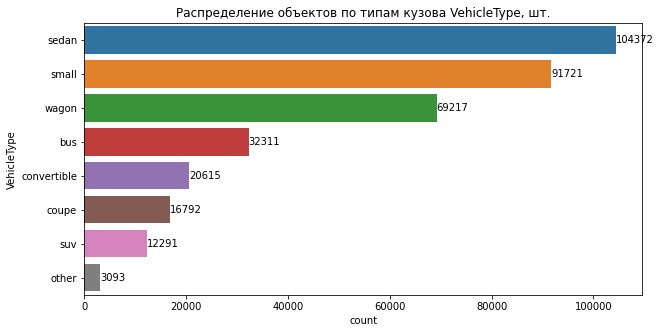

In [42]:
count_graph(df, 'VehicleType', 'Распределение объектов по типам кузова VehicleType, шт.', 10, 5)

Как видно из графика выше, наиболее популярными типами кузовов являются седан(sedan) компакт-формат(small) и универсалы(wagon). Благодаря обработке пропусков, количество объектов имеющих тип кузова other оказалось невелико.

Рассмотрим какие уникальные значенния содержит столбец **Gearbox**:

In [43]:
df['Gearbox'].unique()

array(['manual', 'auto', nan], dtype=object)

Постмотрим какое количество пропусков содержится в столбце:

In [44]:
df['Gearbox'].isna().sum()

18658

Аналогично типу кузова, восстановим тип трансмиссии, опираясь на наиболее распространенное значение отстутсвующего параметра у автомобилей аналогичных брендов, модели и мощности. Т.к. столбец 'Brand_Model_Power' уже существует, упростим код, ранее написанный для замены отсутствующих значений в столбце VehicleType:

In [45]:
GearCount = (df
              .groupby(['Brand_Model_Power','Gearbox'])
              .agg({'Kilometer': 'count'})
              .rename(columns={'Kilometer':'total'})
             )

In [46]:
GearCount.head(10)

,,total
Brand_Model_Power,Gearbox,
alfa_romeo145100.0,manual,2
alfa_romeo145102.0,manual,1
alfa_romeo145103.0,manual,15
alfa_romeo145119.0,manual,1
alfa_romeo145120.0,manual,7
alfa_romeo145129.0,manual,1
alfa_romeo145140.0,manual,2
alfa_romeo145150.0,manual,1
alfa_romeo145227.0,manual,1


In [47]:
GearCountMax = (GearCount.loc[GearCount.groupby(['Brand_Model_Power'])['total']
                   .idxmax(skipna=True)]
                   .sort_values(by='total', ascending=False)
                   .reset_index()
                  )

In [48]:
GearCountMax.head(10)

,Brand_Model_Power,Gearbox,total
0,volkswagengolf75.0,manual,5911
1,volkswagengolf105.0,manual,3003
2,volkswagenpolo60.0,manual,2717
3,volkswagengolf90.0,manual,2287
4,bmw3er150.0,manual,2169
5,volkswagengolf101.0,manual,2093
6,opelcorsa60.0,manual,1851
7,renaulttwingo58.0,manual,1683
8,opelastra75.0,manual,1616
9,volkswagenpolo75.0,manual,1566


In [49]:
for i in tqdm(GearCountMax['Brand_Model_Power']):
    model = GearCountMax.query('Brand_Model_Power == @i')['Gearbox'].reset_index(drop=True)
    df.loc[df['Brand_Model_Power'] == i, 'Gearbox'] = df.loc[df['Brand_Model_Power'] == i, 'Gearbox'].fillna(model[0])

100%|██████████| 11214/11214 [09:16<00:00, 20.15it/s]


Выведем количество пропусков, после проведенного восстановления и что они из себя представляют:

In [50]:
df['Gearbox'].isna().sum()

120

In [51]:
df[df['Gearbox'].isna()].head(10)

,DateCrawled,Price,VehicleType,RegistrationYear,Gearbox,Power,Model,Kilometer,RegistrationMonth,FuelType,Brand,Repaired,DateCreated,NumberOfPictures,PostalCode,LastSeen,Brand_Model_Power
4990,2016-03-25 06:03:23,3300,wagon,2003,NaN,184.0,other,150000,5,gasoline,audi,no,2016-03-25 00:00:00,0,21109,2016-03-25 08:48:04,audiother184.0
5452,2016-03-21 16:42:18,800,bus,1997,NaN,127.0,other,150000,2,petrol,nissan,yes,2016-03-21 00:00:00,0,59073,2016-04-02 16:45:18,nissanother127.0
8906,2016-03-29 17:52:41,2000,sedan,1998,NaN,121.0,a6,150000,2,NaN,audi,NaN,2016-03-29 00:00:00,0,26817,2016-04-06 03:45:20,audia6121.0
11175,2016-03-22 15:55:33,950,sedan,2000,NaN,80.0,cordoba,150000,0,NaN,seat,NaN,2016-03-22 00:00:00,0,30453,2016-04-04 05:51:39,seatcordoba80.0
15940,2016-04-05 12:52:14,2100,sedan,2002,NaN,107.0,sirion,125000,0,petrol,daihatsu,no,2016-04-05 00:00:00,0,7745,2016-04-05 12:52:14,daihatsusirion107.0
16710,2016-03-28 12:52:29,6200,convertible,2003,NaN,148.0,mx_reihe,150000,12,petrol,mazda,no,2016-03-28 00:00:00,0,84347,2016-04-06 16:15:22,mazdamx_reihe148.0
17694,2016-04-04 12:54:07,6800,suv,2010,NaN,85.0,duster,125000,6,gasoline,dacia,no,2016-04-04 00:00:00,0,53842,2016-04-04 13:41:03,daciaduster85.0
18116,2016-03-31 20:46:48,300,small,2001,NaN,107.0,focus,150000,0,petrol,ford,yes,2016-03-31 00:00:00,0,94227,2016-04-06 15:45:14,fordfocus107.0
19173,2016-03-17 21:57:46,999,coupe,2003,NaN,213.0,other,150000,11,petrol,mitsubishi,no,2016-03-17 00:00:00,0,77876,2016-03-17 22:44:29,mitsubishiother213.0
25024,2016-03-11 13:52:01,980,sedan,2002,NaN,208.0,147,150000,7,petrol,alfa_romeo,yes,2016-03-11 00:00:00,0,88677,2016-04-07 09:45:54,alfa_romeo147208.0


Аналогично столбцу VehicleType, удалим оставшиеся уникальные объекты с пропусками в столбце Gearbox.

In [52]:
df = df.dropna(subset=['Gearbox']).reset_index(drop=True)

In [53]:
df['Gearbox'].isna().sum()

0

Выведем итоговое распределение типов трансмиссии по объектам:

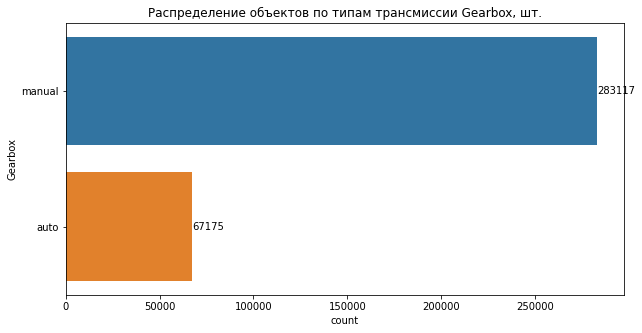

In [54]:
count_graph(df, 'Gearbox', 'Распределение объектов по типам трансмиссии Gearbox, шт.', 10, 5)

Как видно из графика выше, механическая КПП(manual) преобладает среди изучаемых автомобилей 

Рассмотрим какие уникальные значенния содержит столбец **FuelType**:

In [55]:
df['FuelType'].unique()

array(['petrol', 'gasoline', nan, 'lpg', 'other', 'hybrid', 'cng',
       'electric'], dtype=object)

Выведем количество пропусков в рассматриваемом столбце:

In [56]:
df['FuelType'].isna().sum()

31486

Аналогично типу кузова, восстановим тип трансмиссии, опираясь на наиболее распространенное значение отстутсвующего параметра у автомобилей аналогичных брендов, модели и мощности. Т.к. столбец 'Brand_Model_Power' уже существует, упростим код, ранее написанный для замены отсутствующих значений в столбце VehicleType:

In [57]:
FuelCount = (df
              .groupby(['Brand_Model_Power','FuelType'])
              .agg({'Kilometer': 'count'})
              .rename(columns={'Kilometer':'total'})
             )

In [58]:
FuelCount.head(10)

,,total
Brand_Model_Power,FuelType,
alfa_romeo145100.0,petrol,2
alfa_romeo145102.0,petrol,1
alfa_romeo145103.0,petrol,16
alfa_romeo145119.0,petrol,1
alfa_romeo145120.0,petrol,8
alfa_romeo145129.0,petrol,1
alfa_romeo145140.0,petrol,2
alfa_romeo145150.0,petrol,1
alfa_romeo145227.0,petrol,1


In [59]:
FuelCountMax = (FuelCount.loc[FuelCount.groupby(['Brand_Model_Power'])['total']
                   .idxmax(skipna=True)]
                   .sort_values(by='total', ascending=False)
                   .reset_index()
                  )

In [60]:
FuelCountMax.head(10)

,Brand_Model_Power,FuelType,total
0,volkswagengolf75.0,petrol,5706
1,volkswagenpolo60.0,petrol,2605
2,volkswagengolf105.0,gasoline,2200
3,volkswagenpassat140.0,gasoline,1900
4,opelcorsa60.0,petrol,1857
5,bmw3er170.0,petrol,1702
6,renaulttwingo58.0,petrol,1658
7,volkswagengolf101.0,petrol,1529
8,bmw3er150.0,petrol,1514
9,opelastra75.0,petrol,1491


In [61]:
for i in tqdm(FuelCountMax['Brand_Model_Power']):
    model = FuelCountMax.query('Brand_Model_Power == @i')['FuelType'].reset_index(drop=True)
    df.loc[df['Brand_Model_Power'] == i, 'FuelType'] = df.loc[df['Brand_Model_Power'] == i, 'FuelType'].fillna(model[0])

100%|██████████| 10931/10931 [08:59<00:00, 20.27it/s]


Выведем количество пропусков, после проведенного восстановления и что они из себя представляют:

In [62]:
df['FuelType'].isna().sum()

316

In [63]:
df[df['FuelType'].isna()].head(10)

,DateCrawled,Price,VehicleType,RegistrationYear,Gearbox,Power,Model,Kilometer,RegistrationMonth,FuelType,Brand,Repaired,DateCreated,NumberOfPictures,PostalCode,LastSeen,Brand_Model_Power
248,2016-03-10 15:50:57,8000,sedan,2006,manual,177.0,impreza,150000,0,NaN,subaru,no,2016-03-10 00:00:00,0,66540,2016-04-05 13:17:00,subaruimpreza177.0
2307,2016-03-07 00:52:29,0,sedan,1997,auto,375.0,7er,150000,0,NaN,bmw,NaN,2016-03-06 00:00:00,0,44329,2016-03-15 03:15:22,bmw7er375.0
2892,2016-03-07 14:38:59,0,wagon,1999,manual,152.0,passat,150000,4,NaN,volkswagen,yes,2016-03-07 00:00:00,0,33161,2016-03-27 07:17:25,volkswagenpassat152.0
4261,2016-03-05 22:55:24,0,sedan,2007,manual,500.0,5er,100000,4,NaN,bmw,no,2016-03-05 00:00:00,0,41812,2016-04-05 13:46:16,bmw5er500.0
4363,2016-03-19 21:47:25,250,sedan,1999,manual,119.0,other,150000,0,NaN,opel,NaN,2016-03-19 00:00:00,0,99718,2016-04-03 10:20:24,opelother119.0
4586,2016-03-21 00:36:23,870,wagon,2000,manual,16.0,focus,150000,0,NaN,ford,no,2016-03-21 00:00:00,0,66693,2016-03-21 08:40:31,fordfocus16.0
4687,2016-03-17 07:58:17,3990,wagon,2017,manual,81.0,other,60000,1,NaN,mazda,no,2016-03-17 00:00:00,0,6128,2016-03-19 08:18:09,mazdaother81.0
8445,2016-03-21 18:51:36,8950,sedan,2007,auto,211.0,c_klasse,150000,7,NaN,mercedes_benz,NaN,2016-03-21 00:00:00,0,79576,2016-03-25 16:47:31,mercedes_benzc_klasse211.0
9948,2016-03-09 23:38:59,500,coupe,1994,manual,125.0,calibra,150000,7,NaN,opel,yes,2016-03-09 00:00:00,0,33034,2016-04-07 12:17:40,opelcalibra125.0
11672,2016-03-11 14:47:25,2300,wagon,2001,manual,120.0,almera,150000,11,NaN,nissan,NaN,2016-03-11 00:00:00,0,59469,2016-03-19 22:44:49,nissanalmera120.0


Аналогично столбцу VehicleType, удалим оставшиеся уникальные объекты с пропусками в столбце FuelType.

In [64]:
df = df.dropna(subset=['FuelType']).reset_index(drop=True)

In [65]:
df['FuelType'].isna().sum()

0

Выведем итоговое распределение типов трансмиссии по объектам:

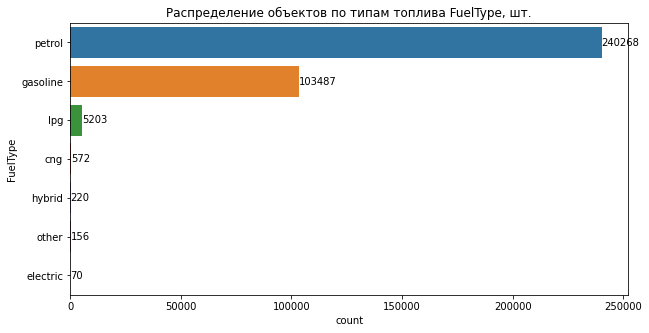

In [66]:
count_graph(df, 'FuelType', 'Распределение объектов по типам топлива FuelType, шт.', 10, 5)

Как видно из графика выше, среди рассмтариваемых автомобилей превалирующее количество составляют автомобили с бензиновыми и дизельными двигателями

Рассмотрим какие уникальные значенния содержит столбец **Repaired**:

In [67]:
df['Repaired'].unique()

array([nan, 'yes', 'no'], dtype=object)

Выведем количество пропусков в рассматриваемом столбце:

In [68]:
df['Repaired'].isna().sum()

69377

Вввиду того, что восстановление отсутствующего признака по имеющимся данным не представляется возможным, заполним из "заглушкой" 'unknown'.

In [69]:
df['Repaired'] = df['Repaired'].fillna('unknown')

Выведем итоговое распределение информации о имеющемся ремонте по объектам:

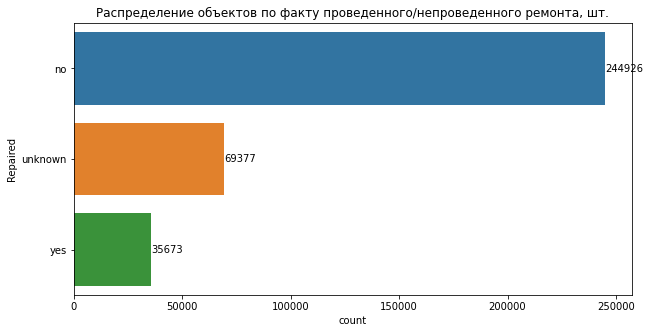

In [70]:
count_graph(df, 'Repaired', 'Распределение объектов по факту проведенного/непроведенного ремонта, шт.', 10, 5)

Как видно из графика выше, среди рассмтариваемых автомобилей превалирующее количество составляют автомобили у которых не было ремонта, количество объектов с заглушкой 'unknown' превысило количество автомобилей с ремонтом.

Проверим что выполненные замены обеспечили отсутствие пропусков в изучаемом датасете:

In [71]:
df.isna().sum()

DateCrawled          0
Price                0
VehicleType          0
RegistrationYear     0
Gearbox              0
Power                0
Model                0
Kilometer            0
RegistrationMonth    0
FuelType             0
Brand                0
Repaired             0
DateCreated          0
NumberOfPictures     0
PostalCode           0
LastSeen             0
Brand_Model_Power    0
dtype: int64

Пропуски устранены.

Проверим датасет на наличие явных дубликатов:

In [72]:
df.duplicated().sum()

4

В датасете имеется 4 дубликата. Выведем их:

In [73]:
df[df.duplicated(keep=False)]

,DateCrawled,Price,VehicleType,RegistrationYear,Gearbox,Power,Model,Kilometer,RegistrationMonth,FuelType,Brand,Repaired,DateCreated,NumberOfPictures,PostalCode,LastSeen,Brand_Model_Power
40999,2016-03-18 18:46:15,1999,wagon,2001,manual,131.0,passat,150000,7,gasoline,volkswagen,no,2016-03-18 00:00:00,0,36391,2016-03-18 18:46:15,volkswagenpassat131.0
87006,2016-03-08 18:42:48,1799,coupe,1999,auto,193.0,clk,20000,7,petrol,mercedes_benz,no,2016-03-08 00:00:00,0,89518,2016-03-09 09:46:57,mercedes_benzclk193.0
89856,2016-03-28 00:56:10,1000,small,2002,manual,83.0,other,150000,1,petrol,suzuki,no,2016-03-28 00:00:00,0,66589,2016-03-28 08:46:21,suzukiother83.0
168955,2016-03-08 18:42:48,1799,coupe,1999,auto,193.0,clk,20000,7,petrol,mercedes_benz,no,2016-03-08 00:00:00,0,89518,2016-03-09 09:46:57,mercedes_benzclk193.0
185406,2016-04-03 09:01:15,4699,coupe,2003,auto,218.0,clk,125000,6,petrol,mercedes_benz,yes,2016-04-03 00:00:00,0,75196,2016-04-07 09:44:54,mercedes_benzclk218.0
228385,2016-03-28 00:56:10,1000,small,2002,manual,83.0,other,150000,1,petrol,suzuki,no,2016-03-28 00:00:00,0,66589,2016-03-28 08:46:21,suzukiother83.0
254905,2016-04-03 09:01:15,4699,coupe,2003,auto,218.0,clk,125000,6,petrol,mercedes_benz,yes,2016-04-03 00:00:00,0,75196,2016-04-07 09:44:54,mercedes_benzclk218.0
321633,2016-03-18 18:46:15,1999,wagon,2001,manual,131.0,passat,150000,7,gasoline,volkswagen,no,2016-03-18 00:00:00,0,36391,2016-03-18 18:46:15,volkswagenpassat131.0


Удалим выявленные явные дубликаты:

In [74]:
df = df.drop_duplicates().reset_index(drop=True)

Проверим что удаление прошло успешно:

In [75]:
df.duplicated().sum()

0

Явные дубликаты удалены

Проверим датасет на наличие неявных дубликатов. Уникальные значения столбцов 'VehicleType', 'Gearbox', 'Model', ' FuelType', 'Repaired' были проверерны выше, неявных дуликатов в них не обнаружено (было выявлено различное написание модели Range Rover, а именно range_rover и rangerover, но на проверку выяснилось что модель rangerover относится к бренду rover. Осталось проверить столбец 'Brand'

In [76]:
sorted(df['Brand'].unique())

['alfa_romeo',
 'audi',
 'bmw',
 'chevrolet',
 'chrysler',
 'citroen',
 'dacia',
 'daewoo',
 'daihatsu',
 'fiat',
 'ford',
 'honda',
 'hyundai',
 'jaguar',
 'jeep',
 'kia',
 'lada',
 'lancia',
 'land_rover',
 'mazda',
 'mercedes_benz',
 'mini',
 'mitsubishi',
 'nissan',
 'opel',
 'peugeot',
 'porsche',
 'renault',
 'rover',
 'saab',
 'seat',
 'skoda',
 'smart',
 'subaru',
 'suzuki',
 'toyota',
 'trabant',
 'volkswagen',
 'volvo']

Неявных дубликатов в столбце 'Brand' не выявлено

Рассмотрим распределение количественных признаков, для этого будем использовать функцию ниже:

In [77]:
def num_stat_and_graph(df, col, n, title):
    stat = df[col].describe()
    fig, axes = plt.subplots(1,2, figsize=(15,5))
    sns.histplot(df[col], bins=n, ax=axes[0])
    sns.boxplot(data=df, x=col)
    fig.suptitle(title);
    return stat

Рассмотрим распределение целевого признака **Price**:

count    349972.000000
mean       4412.089736
std        4503.049286
min           0.000000
25%        1099.000000
50%        2700.000000
75%        6399.000000
max       20000.000000
Name: Price, dtype: float64

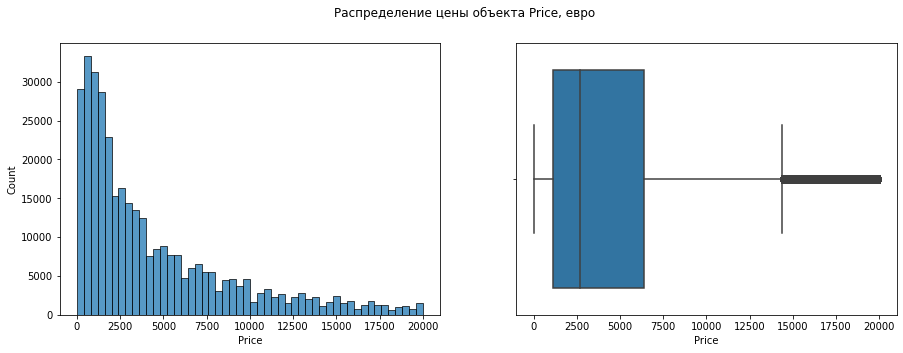

In [78]:
num_stat_and_graph(df, 'Price', 50, 'Распределение цены объекта Price, евро')

Как видно на графиках выше, "ящик с усами" считает выбросами все значения более 15000 евро, однако максимальное значение цены составляет 20000 евро и это реальная цифра, поэтому удалять данные объекты мы не будем. Однако, мы видим что минимальное значение цены составляет 0 евро, что является аномалией, т.к. врятли кто-либо отдает свой автомобиль бесплатно. Удалим объекты, содержащие значения 'Price' = 0

In [79]:
df = df[df['Price'] != 0]

count    339806.000000
mean       4544.086535
std        4503.808388
min           1.000000
25%        1200.000000
50%        2850.000000
75%        6500.000000
max       20000.000000
Name: Price, dtype: float64

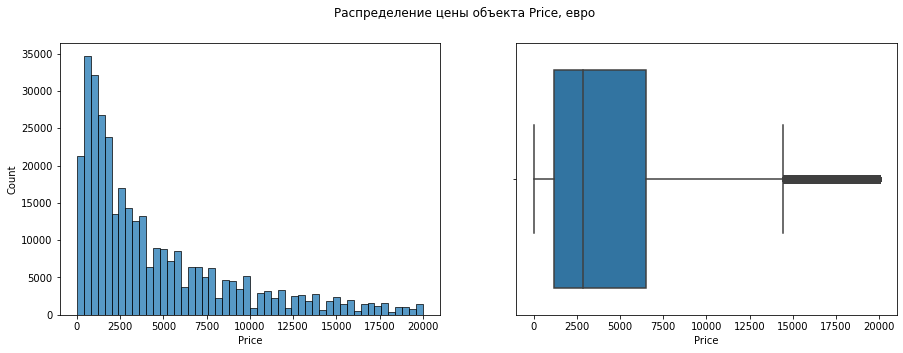

In [80]:
num_stat_and_graph(df, 'Price', 50, 'Распределение цены объекта Price, евро')

Как видно из графика выше, в датасете все равно остались экстремально низкие цены на автомобили, которые не выглядят реальными (врятли кто-то будет продавать авто за 1 евро, даже ели он битый, не на ходу и без документов), поэтому ограничим минимальную цену на автомобиль порогом в 100 евро:

In [81]:
df = df[df['Price'] >= 100]

count    337432.000000
mean       4575.850749
std        4503.617719
min         100.000000
25%        1200.000000
50%        2900.000000
75%        6500.000000
max       20000.000000
Name: Price, dtype: float64

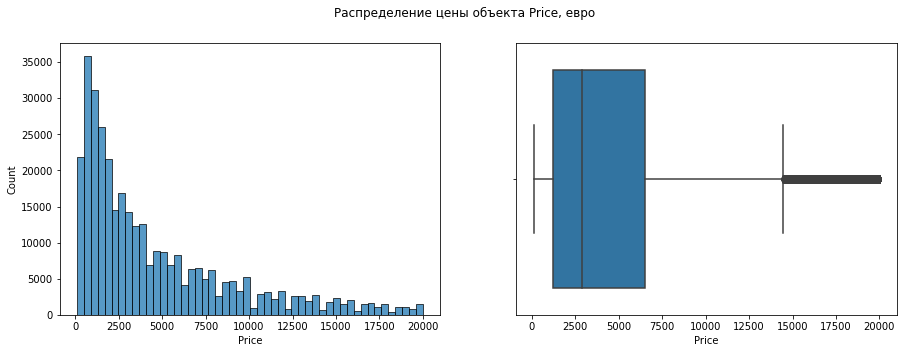

In [82]:
num_stat_and_graph(df, 'Price', 50, 'Распределение цены объекта Price, евро')

Рассмотрим распределение входного признака **Power**:

count    337432.000000
mean        117.494623
std          50.966719
min          10.000000
25%          82.000000
50%         105.000000
75%         143.000000
max         600.000000
Name: Power, dtype: float64

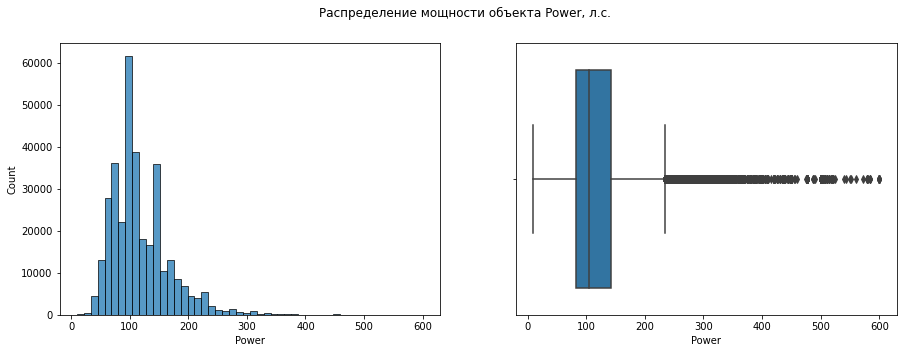

In [83]:
num_stat_and_graph(df, 'Power', 50, 'Распределение мощности объекта Power, л.с.')

Данный признак был обработан при устранении пропусков в категориальных столбцах (см. выше)

Рассмотрим распределение входного признака **RegistrationYear**:

count    337432.000000
mean       2003.846464
std          61.348782
min        1000.000000
25%        1999.000000
50%        2003.000000
75%        2008.000000
max        9999.000000
Name: RegistrationYear, dtype: float64

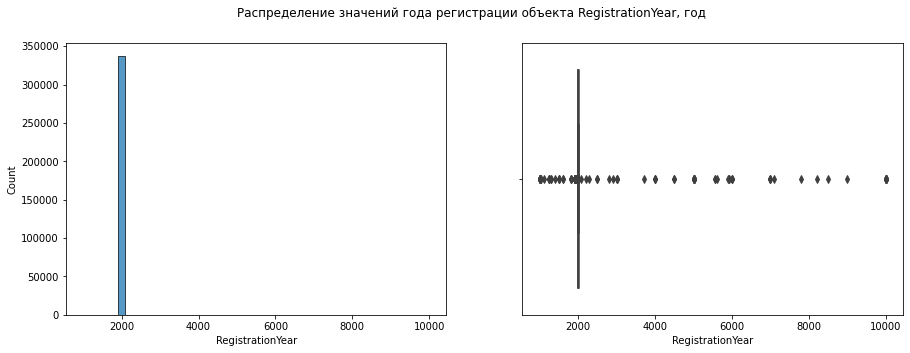

In [84]:
num_stat_and_graph(df, 'RegistrationYear', 50, 'Распределение значений года регистрации объекта RegistrationYear, год')

In [85]:
sorted(df['RegistrationYear'].unique())

[1000,
 1001,
 1039,
 1111,
 1234,
 1300,
 1400,
 1500,
 1600,
 1602,
 1800,
 1910,
 1923,
 1927,
 1928,
 1929,
 1930,
 1931,
 1932,
 1933,
 1934,
 1935,
 1936,
 1937,
 1938,
 1940,
 1941,
 1942,
 1943,
 1945,
 1947,
 1950,
 1951,
 1952,
 1953,
 1954,
 1955,
 1956,
 1957,
 1958,
 1959,
 1960,
 1961,
 1962,
 1963,
 1964,
 1965,
 1966,
 1967,
 1968,
 1969,
 1970,
 1971,
 1972,
 1973,
 1974,
 1975,
 1976,
 1977,
 1978,
 1979,
 1980,
 1981,
 1982,
 1983,
 1984,
 1985,
 1986,
 1987,
 1988,
 1989,
 1990,
 1991,
 1992,
 1993,
 1994,
 1995,
 1996,
 1997,
 1998,
 1999,
 2000,
 2001,
 2002,
 2003,
 2004,
 2005,
 2006,
 2007,
 2008,
 2009,
 2010,
 2011,
 2012,
 2013,
 2014,
 2015,
 2016,
 2017,
 2018,
 2019,
 2066,
 2200,
 2290,
 2500,
 2800,
 2900,
 3000,
 3700,
 4000,
 4500,
 5000,
 5555,
 5600,
 5900,
 5911,
 6000,
 7000,
 7100,
 7800,
 8200,
 8500,
 9000,
 9999]

Однозначно значения с 1000 до 1800 включительно, а также от 2017(т.к. самая поздняя дата создания анкет 2016 год) до 9999 включительно, можно считать аномалиями. Проверим какие объекты имеют год регистрации 1910:

In [86]:
df[df['RegistrationYear'] == 1910] 

,DateCrawled,Price,VehicleType,RegistrationYear,Gearbox,Power,Model,Kilometer,RegistrationMonth,FuelType,Brand,Repaired,DateCreated,NumberOfPictures,PostalCode,LastSeen,Brand_Model_Power
15,2016-03-11 21:39:15,450,small,1910,manual,95.0,ka,5000,0,petrol,ford,unknown,2016-03-11 00:00:00,0,24148,2016-03-19 08:46:47,fordka95.0
6887,2016-03-24 08:37:22,135,small,1910,manual,95.0,other,5000,0,petrol,opel,unknown,2016-03-24 00:00:00,0,19374,2016-04-06 20:46:08,opelother95.0
10060,2016-03-27 13:59:08,1250,sedan,1910,manual,95.0,other,5000,0,petrol,audi,unknown,2016-03-27 00:00:00,0,18445,2016-04-07 10:45:31,audiother95.0
23454,2016-03-16 19:58:34,3900,wagon,1910,manual,90.0,passat,150000,0,petrol,volkswagen,unknown,2016-03-16 00:00:00,0,88662,2016-04-07 05:45:53,volkswagenpassat90.0
35478,2016-03-19 10:57:31,200,other,1910,manual,95.0,caddy,150000,0,gasoline,volkswagen,unknown,2016-03-19 00:00:00,0,35096,2016-03-20 18:10:33,volkswagencaddy95.0
48339,2016-03-09 07:36:58,600,small,1910,manual,95.0,agila,5000,0,petrol,opel,yes,2016-03-09 00:00:00,0,61279,2016-04-06 05:46:18,opelagila95.0
62027,2016-03-07 22:58:46,3400,small,1910,manual,90.0,beetle,90000,4,gasoline,volkswagen,no,2016-03-07 00:00:00,0,34308,2016-03-12 08:16:51,volkswagenbeetle90.0
63547,2016-03-11 09:37:13,160,small,1910,manual,95.0,other,5000,0,petrol,hyundai,unknown,2016-03-11 00:00:00,0,52525,2016-03-24 10:15:33,hyundaiother95.0
73893,2016-03-21 12:52:05,400,sedan,1910,manual,60.0,golf,150000,0,petrol,volkswagen,unknown,2016-03-21 00:00:00,0,29462,2016-03-25 09:17:54,volkswagengolf60.0
77411,2016-04-04 20:39:52,250,other,1910,manual,95.0,other,5000,1,petrol,audi,unknown,2016-04-04 00:00:00,0,99947,2016-04-06 22:46:27,audiother95.0


Как видно из таблицы выше, объекты с годом регистрации 1910 представлены моделями авто, которые еще не вышли в свет в этом году, булем также считать данные значения аномалиями. Расмотрим объекты годом регистрации 1923:

In [87]:
df[df['RegistrationYear'] == 1923] 

,DateCrawled,Price,VehicleType,RegistrationYear,Gearbox,Power,Model,Kilometer,RegistrationMonth,FuelType,Brand,Repaired,DateCreated,NumberOfPictures,PostalCode,LastSeen,Brand_Model_Power
115942,2016-03-14 14:00:30,8750,convertible,1923,manual,11.0,c3,5000,0,petrol,citroen,no,2016-03-14 00:00:00,0,27299,2016-04-05 16:44:28,citroenc311.0
320047,2016-03-16 17:57:29,8750,convertible,1923,manual,95.0,c3,5000,1,petrol,citroen,no,2016-03-16 00:00:00,0,27299,2016-04-04 22:16:07,citroenc395.0


Согласно информации каталога с сайта auto.ru https://auto.ru/catalog/cars/citroen/c3/ модель citroen c3 производится с 2002 годаб значит значение 1923 также аномально 

In [88]:
df[df['RegistrationYear'] == 1927] 

,DateCrawled,Price,VehicleType,RegistrationYear,Gearbox,Power,Model,Kilometer,RegistrationMonth,FuelType,Brand,Repaired,DateCreated,NumberOfPictures,PostalCode,LastSeen,Brand_Model_Power
296192,2016-03-12 08:36:21,16500,convertible,1927,manual,40.0,other,5000,5,petrol,ford,unknown,2016-03-12 00:00:00,0,74821,2016-03-15 12:45:12,fordother40.0


In [89]:
df[df['RegistrationYear'] == 1928] 

,DateCrawled,Price,VehicleType,RegistrationYear,Gearbox,Power,Model,Kilometer,RegistrationMonth,FuelType,Brand,Repaired,DateCreated,NumberOfPictures,PostalCode,LastSeen,Brand_Model_Power
176977,2016-03-15 23:54:31,5200,sedan,1928,manual,95.0,other,5000,0,petrol,citroen,unknown,2016-03-15 00:00:00,0,79299,2016-04-06 00:46:07,citroenother95.0
232577,2016-03-17 07:37:03,9999,convertible,1928,manual,40.0,other,150000,6,petrol,ford,unknown,2016-03-17 00:00:00,0,27419,2016-04-06 05:16:30,fordother40.0


In [90]:
df[df['RegistrationYear'] == 1929] 

,DateCrawled,Price,VehicleType,RegistrationYear,Gearbox,Power,Model,Kilometer,RegistrationMonth,FuelType,Brand,Repaired,DateCreated,NumberOfPictures,PostalCode,LastSeen,Brand_Model_Power
135637,2016-03-09 16:51:17,11500,convertible,1929,manual,15.0,other,5000,1,petrol,bmw,yes,2016-03-09 00:00:00,0,70569,2016-04-07 06:17:11,bmwother15.0
227235,2016-03-09 16:52:31,11500,convertible,1929,manual,15.0,other,5000,1,petrol,bmw,yes,2016-03-09 00:00:00,0,70569,2016-04-07 06:44:38,bmwother15.0
331938,2016-03-11 11:51:33,20000,coupe,1929,manual,12.0,other,10000,4,petrol,bmw,unknown,2016-03-11 00:00:00,0,74523,2016-04-07 05:45:00,bmwother12.0


In [91]:
df[df['RegistrationYear'] == 1930] 

,DateCrawled,Price,VehicleType,RegistrationYear,Gearbox,Power,Model,Kilometer,RegistrationMonth,FuelType,Brand,Repaired,DateCreated,NumberOfPictures,PostalCode,LastSeen,Brand_Model_Power
121378,2016-03-08 03:58:35,8000,other,1930,manual,23.0,other,150000,0,petrol,peugeot,unknown,2016-03-08 00:00:00,0,74523,2016-03-29 09:45:15,peugeotother23.0
302653,2016-03-29 03:36:23,16800,other,1930,manual,24.0,other,150000,1,petrol,ford,no,2016-03-29 00:00:00,0,51063,2016-04-05 17:25:58,fordother24.0


In [92]:
df[df['RegistrationYear'] == 1931] 

,DateCrawled,Price,VehicleType,RegistrationYear,Gearbox,Power,Model,Kilometer,RegistrationMonth,FuelType,Brand,Repaired,DateCreated,NumberOfPictures,PostalCode,LastSeen,Brand_Model_Power
260313,2016-04-03 20:37:38,4700,other,1931,auto,40.0,other,150000,1,petrol,ford,yes,2016-04-03 00:00:00,0,23769,2016-04-05 21:16:51,fordother40.0


Начиная с 1927 года модели начинают выглядеть правдоподобно, примем его за нижнюю границу реального диапазона параметра RegistrationYear:

Т.к. восстановить данные о годе регистрации мы не можем, удалим все объекиы с нереалистичными данными в данном столбце:

In [93]:
df = df.query('1927 <= RegistrationYear <= 2016').reset_index(drop = True)

count    324037.000000
mean       2002.706567
std           6.604921
min        1927.000000
25%        1999.000000
50%        2003.000000
75%        2007.000000
max        2016.000000
Name: RegistrationYear, dtype: float64

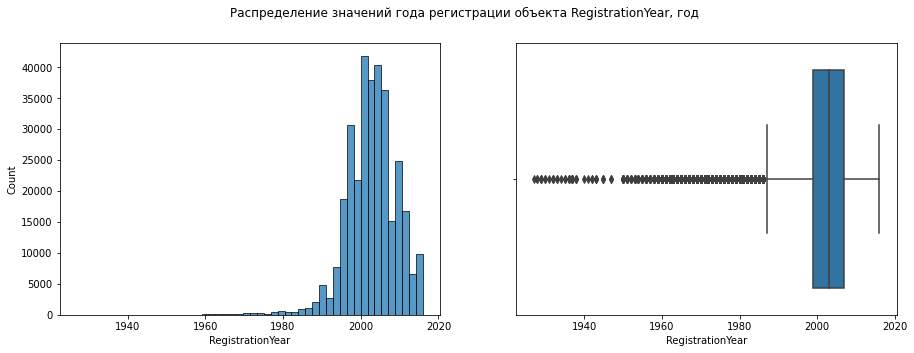

In [94]:
num_stat_and_graph(df, 'RegistrationYear', 50, 'Распределение значений года регистрации объекта RegistrationYear, год')

Аномалии в параметре RegistrationYear обработаны, удалены нереально высоки и низкие значения.

Рассмотрим распределение входного признака Kilometer:

count    324037.000000
mean     128645.355314
std       36924.886755
min        5000.000000
25%      125000.000000
50%      150000.000000
75%      150000.000000
max      150000.000000
Name: Kilometer, dtype: float64

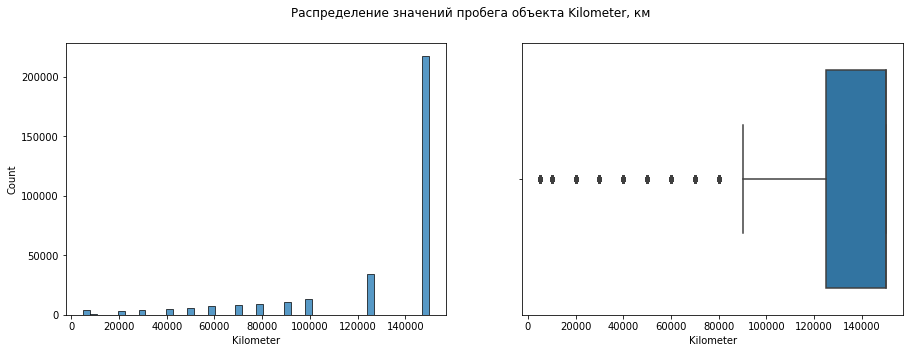

In [95]:
num_stat_and_graph(df, 'Kilometer', 50, 'Распределение значений пробега объекта Kilometer, км')

In [96]:
df['Kilometer'].value_counts()

150000    217539
125000     34021
100000     13669
90000      10888
80000       9478
70000       8115
60000       7106
50000       5860
40000       4671
5000        4128
30000       4088
20000       3505
10000        969
Name: Kilometer, dtype: int64

Как видно из значений таблицы и графика выше, аномальные значения в столбце Kilometer отсутствуют, однако очень большое количество объектов составляют объекты с пробегом 150_000 км. Возможно это максимальное значение, которое можно выбрать при заполнении анкеты (т.к. все значения кратны 10_000 видимо оно вводится не вручную. В любом случае исправить данное распределение мы не можем. 

Рассмотрим распределение входного признака **RegistrationMonth**:

count    324037.000000
mean          5.849718
std           3.667302
min           0.000000
25%           3.000000
50%           6.000000
75%           9.000000
max          12.000000
Name: RegistrationMonth, dtype: float64

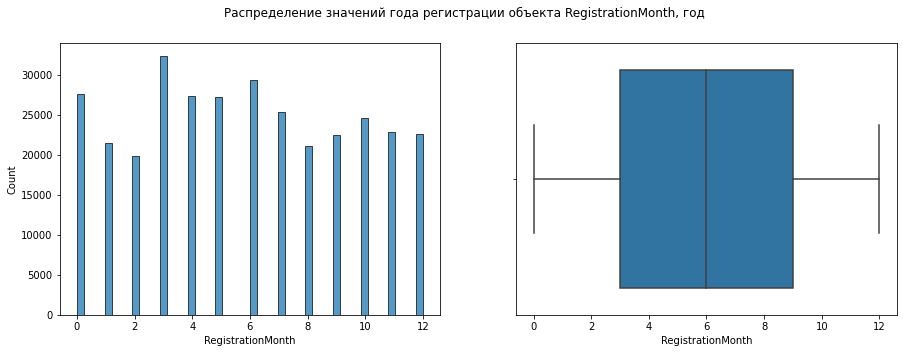

In [97]:
num_stat_and_graph(df, 'RegistrationMonth', 50, 'Распределение значений года регистрации объекта RegistrationMonth, год')

In [98]:
df['RegistrationMonth'].value_counts().sort_index()

0     27601
1     21474
2     19892
3     32331
4     27343
5     27220
6     29369
7     25314
8     21092
9     22407
10    24580
11    22777
12    22637
Name: RegistrationMonth, dtype: int64

Как видно по таблице и графику выше, столбец RegistrationMonth имеет аномальное значение метода 0. Восстановить данное значение по имеющимся данным не представляется возможным, присвоиение самого часто встречающегося значения нарушит имеющееся равномерное (приблизительно) распределение между месяцами. Ввиду предположения того, что стоимость автомобиля не имеет выраженной зависимости от месяца регистрации автомобиля, оставим имеющееся распределение значений столбца 'RegistrationMonth'.

Рассмотрим распределение входного признака **NumberOfPictures**:

count    324037.0
mean          0.0
std           0.0
min           0.0
25%           0.0
50%           0.0
75%           0.0
max           0.0
Name: NumberOfPictures, dtype: float64

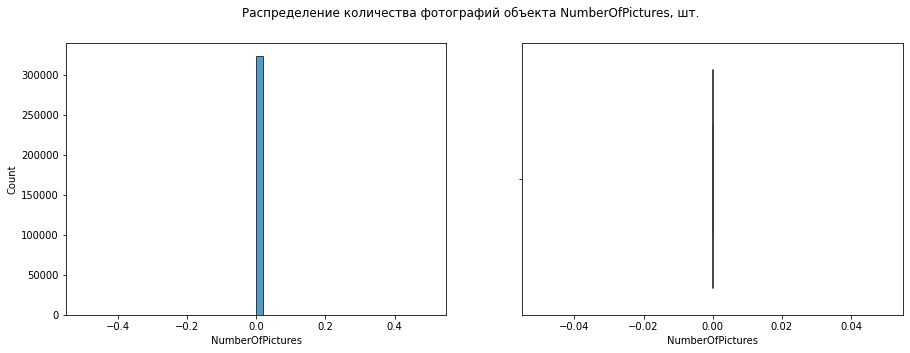

In [99]:
num_stat_and_graph(df, 'NumberOfPictures', 50, 'Распределение количества фотографий объекта NumberOfPictures, шт.')

Как видно из таблицы и графика выше, все значения столбца NumberOfPictures представлены нулями, поэтому данный столбец можно удалить (заодно удалим ранее созданный столбец 'Brand_Model_Power'.

In [100]:
df = df.drop(['NumberOfPictures', 'Brand_Model_Power'],  axis=1)

Рассмотрим распределение входного признака **PostalCode**:

count    324037.000000
mean      50808.921435
std       25735.481001
min        1067.000000
25%       30519.000000
50%       49661.000000
75%       71336.000000
max       99998.000000
Name: PostalCode, dtype: float64

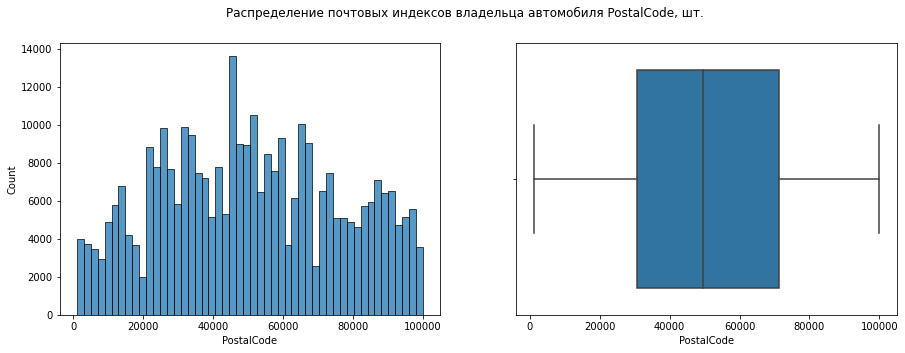

In [101]:
num_stat_and_graph(df, 'PostalCode', 50, 'Распределение почтовых индексов владельца автомобиля PostalCode, шт.')

Как видно из таблицы и графика выше, аномальных значений в столбце PostalCode не наблюдается

Рассмотрим распределение входного признака **DateCrawled** - дата скачивания анкеты из базы:

Выведем минимальное и максимальное значение признака:

In [102]:
df['DateCrawled'].min()

'2016-03-05 14:06:22'

In [103]:
df['DateCrawled'].max()

'2016-04-07 14:36:58'

In [104]:
df['DateCrawled'].value_counts().head(20)

2016-03-24 14:49:47    7
2016-04-01 19:25:23    5
2016-03-29 22:50:49    5
2016-03-26 10:51:07    5
2016-04-02 22:54:55    5
2016-03-07 17:36:19    5
2016-03-21 14:50:20    5
2016-03-19 21:49:56    5
2016-03-26 22:57:31    5
2016-04-04 22:38:11    5
2016-04-02 21:54:36    5
2016-03-28 10:48:11    5
2016-03-23 13:50:19    5
2016-03-31 16:50:28    5
2016-03-05 14:44:30    5
2016-03-05 14:25:23    5
2016-03-22 14:50:05    5
2016-03-31 18:50:16    5
2016-03-20 16:50:22    5
2016-03-09 13:50:56    5
Name: DateCrawled, dtype: int64

Как видно из максимального и минимального значения выше, все значения признака 'DateCrawled' лежат в промежутке между '2016-03-05 14:06:22'   
и '2016-04-07 14:36:58'. Также видно что практически все значения параметра являются уникальными и соответственно не повышают обобщающую способность модели, соответственно что дата выгрузки не будет существенно влиять на стоимость автомобиля и может быть удалена.

In [105]:
df = df.drop('DateCrawled', axis=1)

Рассмотрим распределение входного признака **DateCreated** - дата создания анкеты:

In [106]:
df['DateCreated'].min()

'2014-03-10 00:00:00'

In [107]:
df['DateCreated'].max()

'2016-04-07 00:00:00'

In [108]:
df['DateCreated'].value_counts().head(50)

2016-04-03 00:00:00    12648
2016-04-04 00:00:00    12174
2016-03-20 00:00:00    11820
2016-03-12 00:00:00    11815
2016-03-21 00:00:00    11580
2016-03-14 00:00:00    11392
2016-03-28 00:00:00    11361
2016-04-02 00:00:00    11288
2016-03-07 00:00:00    11212
2016-03-19 00:00:00    11136
2016-03-09 00:00:00    11092
2016-03-29 00:00:00    11059
2016-04-01 00:00:00    10974
2016-03-08 00:00:00    10892
2016-03-30 00:00:00    10824
2016-03-15 00:00:00    10771
2016-03-11 00:00:00    10637
2016-03-25 00:00:00    10618
2016-03-10 00:00:00    10579
2016-03-22 00:00:00    10445
2016-03-26 00:00:00    10427
2016-03-23 00:00:00    10361
2016-03-31 00:00:00    10331
2016-03-17 00:00:00    10136
2016-03-16 00:00:00     9923
2016-03-24 00:00:00     9635
2016-03-27 00:00:00     9592
2016-03-05 00:00:00     7517
2016-03-13 00:00:00     5536
2016-03-06 00:00:00     5045
2016-03-18 00:00:00     4544
2016-04-05 00:00:00     3704
2016-04-06 00:00:00      997
2016-03-04 00:00:00      562
2016-04-07 00:

In [109]:
df['DateCreated'].value_counts().sort_index().head(10)

2014-03-10 00:00:00    1
2015-03-20 00:00:00    1
2015-06-18 00:00:00    1
2015-08-07 00:00:00    1
2015-08-10 00:00:00    1
2015-09-04 00:00:00    2
2015-09-09 00:00:00    1
2015-11-02 00:00:00    1
2015-11-08 00:00:00    1
2015-11-10 00:00:00    1
Name: DateCreated, dtype: int64

Как видно из максимального и минимального значения выше, все значения признака 'DateCrawled' лежат в промежутке между '2014-03-10 00:00:00' 
и '2016-04-07 00:00:00'. Также видно что весьма значительная часть анкет была загружена в марте и апреле 2016 года, также имеется незначительная часть акет загруженных в 2015 году и одна в 2014 году. оставим данный признак, немного видоизменив - оставим только дату без дефисов, преобразованную в число без (как '2016-03-24' = 20160324)

In [110]:
df['DateCreated'] = (pd.to_datetime(df['DateCreated'])
                     .astype('str')
                     .str.replace('-', '')
                     .astype('int')
                    )

In [111]:
df.head()

,Price,VehicleType,RegistrationYear,Gearbox,Power,Model,Kilometer,RegistrationMonth,FuelType,Brand,Repaired,DateCreated,PostalCode,LastSeen
0,480,sedan,1993,manual,95.0,golf,150000,0,petrol,volkswagen,unknown,20160324,70435,2016-04-07 03:16:57
1,18300,coupe,2011,manual,190.0,other,125000,5,gasoline,audi,yes,20160324,66954,2016-04-07 01:46:50
2,9800,suv,2004,auto,163.0,grand,125000,8,gasoline,jeep,unknown,20160314,90480,2016-04-05 12:47:46
3,1500,small,2001,manual,75.0,golf,150000,6,petrol,volkswagen,no,20160317,91074,2016-03-17 17:40:17
4,3600,small,2008,manual,69.0,fabia,90000,7,gasoline,skoda,no,20160331,60437,2016-04-06 10:17:21


Рассмотрим распределение входного признака **LastSeen** - дата последней активности пользователя:

Выведем минимальное и максимальное значение признака:

In [112]:
df['LastSeen'].min()

'2016-03-05 14:15:08'

In [113]:
df['LastSeen'].max()

'2016-04-07 14:58:51'

In [114]:
df['LastSeen'].value_counts().head(20)

2016-04-07 13:17:48    16
2016-04-06 01:15:23    16
2016-04-06 04:15:59    16
2016-04-06 13:45:54    16
2016-04-06 05:45:43    15
2016-04-07 01:15:20    15
2016-04-07 07:17:18    15
2016-04-07 09:44:27    15
2016-04-06 09:46:00    15
2016-04-07 10:16:29    15
2016-04-05 23:47:15    15
2016-04-06 09:17:58    15
2016-04-06 07:46:44    15
2016-04-06 13:46:17    15
2016-04-07 06:16:25    15
2016-04-06 12:15:45    15
2016-04-07 10:16:55    15
2016-04-06 13:16:00    15
2016-04-06 12:44:51    15
2016-04-06 11:16:27    15
Name: LastSeen, dtype: int64

Как видно из максимального и минимального значения выше, все значения признака 'LastSeen' лежат в промежутке между '2016-03-05 14:15:08'   
и '2016-04-07 14:58:51'. Также видно что практически все значения параметра являются уникальными и соответственно не повышают обобщающую способность модели, соответственно  дата последней активности пользователя не будет существенно влиять на стоимость автомобиля и может быть удалена.

In [115]:
df = df.drop('LastSeen', axis=1)

In [116]:
df.reset_index(drop=True).head(10)

,Price,VehicleType,RegistrationYear,Gearbox,Power,Model,Kilometer,RegistrationMonth,FuelType,Brand,Repaired,DateCreated,PostalCode
0,480,sedan,1993,manual,95.0,golf,150000,0,petrol,volkswagen,unknown,20160324,70435
1,18300,coupe,2011,manual,190.0,other,125000,5,gasoline,audi,yes,20160324,66954
2,9800,suv,2004,auto,163.0,grand,125000,8,gasoline,jeep,unknown,20160314,90480
3,1500,small,2001,manual,75.0,golf,150000,6,petrol,volkswagen,no,20160317,91074
4,3600,small,2008,manual,69.0,fabia,90000,7,gasoline,skoda,no,20160331,60437
5,650,sedan,1995,manual,102.0,3er,150000,10,petrol,bmw,yes,20160404,33775
6,2200,convertible,2004,manual,109.0,2_reihe,150000,8,petrol,peugeot,no,20160401,67112
7,14500,bus,2014,manual,125.0,c_max,30000,8,petrol,ford,unknown,20160404,94505
8,999,small,1998,manual,101.0,golf,150000,0,petrol,volkswagen,unknown,20160317,27472
9,2000,sedan,2004,manual,105.0,3_reihe,150000,12,petrol,mazda,no,20160326,96224


Проверим датасет на корреляцию входных признаков с целевым признаком и между собой, т.к. в  данных содержится значительное количество категориальных признаков, воспользуемся phik матрицей:

In [117]:
interval_cols = ['Price', 'RegistrationYear', 'Power', 'RegistrationMonth', 'DateCreated', 'PostalCode']

In [118]:
phik_overview = phik_matrix(df, interval_cols=interval_cols)

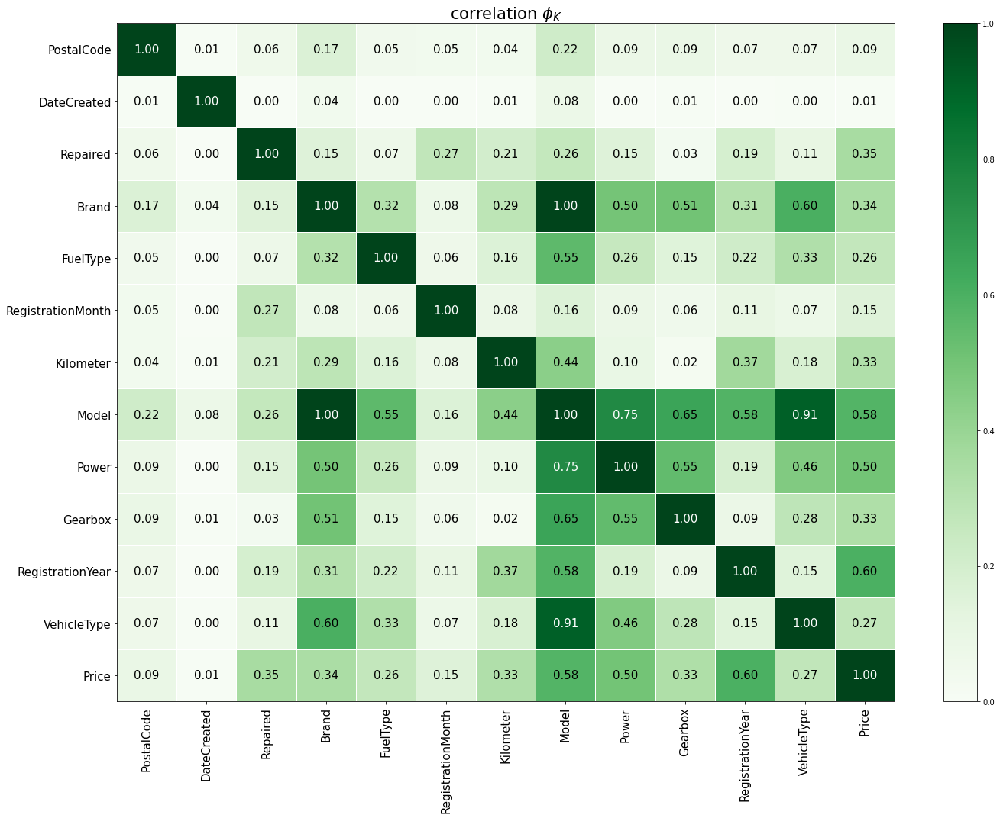

In [119]:
plot_correlation_matrix(
    phik_overview.values,
    x_labels=phik_overview.columns,
    y_labels=phik_overview.index,
    vmin=0, vmax=1, color_map='Greens',
    title=r'correlation $\phi_K$',
    fontsize_factor=1.5,
    figsize=(20, 15)
) 

Как видно из матрицы выше, с целевым признаком практически не коррелируют входные признаки PostalCode и DataCreated, можно их удалить. 

In [120]:
df = df.drop(['DateCreated', 'PostalCode'], axis=1)

In [121]:
df.head(10)

,Price,VehicleType,RegistrationYear,Gearbox,Power,Model,Kilometer,RegistrationMonth,FuelType,Brand,Repaired
0,480,sedan,1993,manual,95.0,golf,150000,0,petrol,volkswagen,unknown
1,18300,coupe,2011,manual,190.0,other,125000,5,gasoline,audi,yes
2,9800,suv,2004,auto,163.0,grand,125000,8,gasoline,jeep,unknown
3,1500,small,2001,manual,75.0,golf,150000,6,petrol,volkswagen,no
4,3600,small,2008,manual,69.0,fabia,90000,7,gasoline,skoda,no
5,650,sedan,1995,manual,102.0,3er,150000,10,petrol,bmw,yes
6,2200,convertible,2004,manual,109.0,2_reihe,150000,8,petrol,peugeot,no
7,14500,bus,2014,manual,125.0,c_max,30000,8,petrol,ford,unknown
8,999,small,1998,manual,101.0,golf,150000,0,petrol,volkswagen,unknown
9,2000,sedan,2004,manual,105.0,3_reihe,150000,12,petrol,mazda,no


Рассмотрим рассеяние количесвтенных признаков относительно целевого, цветом выделим распределение количественных признаков (VehicleType, Gearbox, FuelType и Repaired.  Model и Brand брать не будем, т.к. они имеют слишком много уникальных значений)

Диаграмма рассеяния между признаками 'Price' и 'RegistrationYear', цвет точек диаграммы отображает признак 'VehicleType'

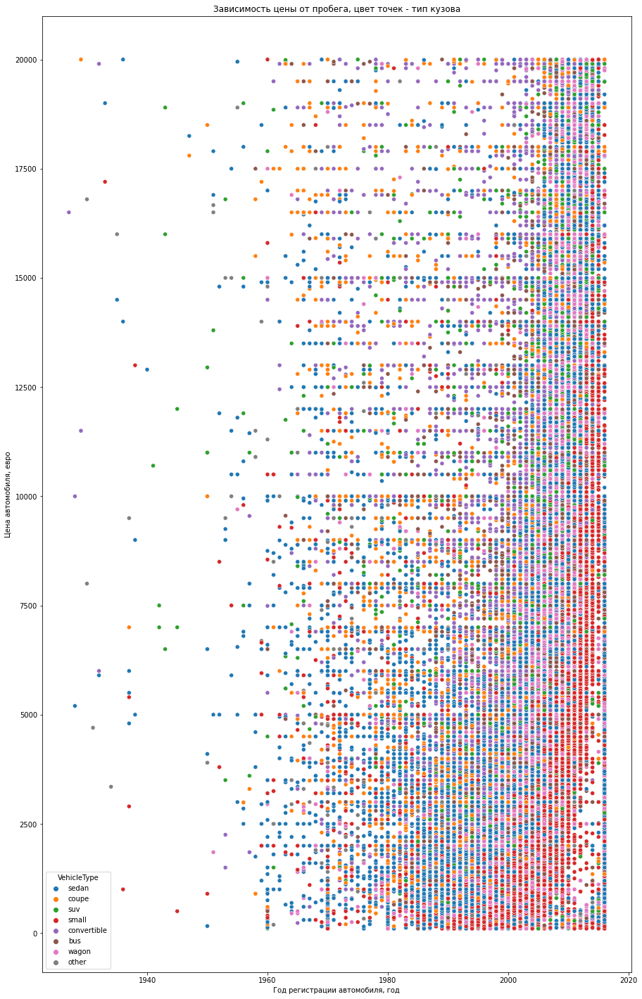

In [122]:
ax, fig = plt.subplots(figsize=(15,25))
sns.scatterplot(data=df, x='RegistrationYear', y='Price', hue='VehicleType');
plt.xlabel('Год регистрации автомобиля, год');
plt.ylabel('Цена автомобиля, евро');
plt.title("Зависимость цены от пробега, цвет точек - тип кузова");

Как видно на графике выше, зависимость между ценой и годом регистрации автомобиля имеют скорее квадратичную зависимость, похожую на правую ветвь пораболы. В части распределения по типу кузова, просматривается закономерность распределения автомобилей c типом кузова small. Как видно, это самый дешевый тип кузова, стоимость которого повышается по мере увеличения года регистрации (как раз на этом типе кузова хорошо читается порабола), остальные типы кузова расположены достаточно хаотично и сделать какие-либо выводы о них - сложно

Диаграмма рассеяния между признаками 'Price' и 'RegistrationYear', цвет точек диаграммы отображает признак 'Gearbox'

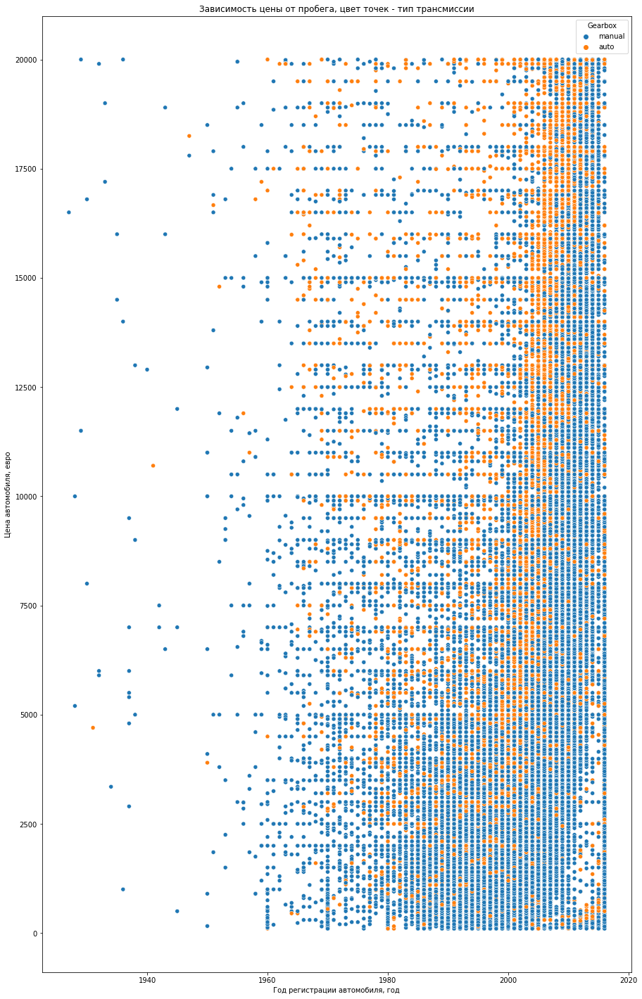

In [123]:
ax, fig = plt.subplots(figsize=(15,25))
sns.scatterplot(data=df, x='RegistrationYear', y='Price', hue='Gearbox');
plt.xlabel('Год регистрации автомобиля, год');
plt.ylabel('Цена автомобиля, евро');
plt.title("Зависимость цены от пробега, цвет точек - тип трансмиссии");

Как видно на графике выше, автомобили в низком ценовом сегменте (до 3000 евро), в основном представлены механической коробкой передач (manual), по мере увеличения цены увеличивается количество автомобилей с автоматической КПП (auto). В части распределения типов КПП по годам, то оно вцелом равномерное, с 2000 года видится увеличения колисчества автомобилей с автоматической КПП, однако в последние годы оно как будто бы упало.

Диаграмма рассеяния между признаками 'Price' и 'RegistrationYear', цвет точек диаграммы отображает признак 'FuelType'

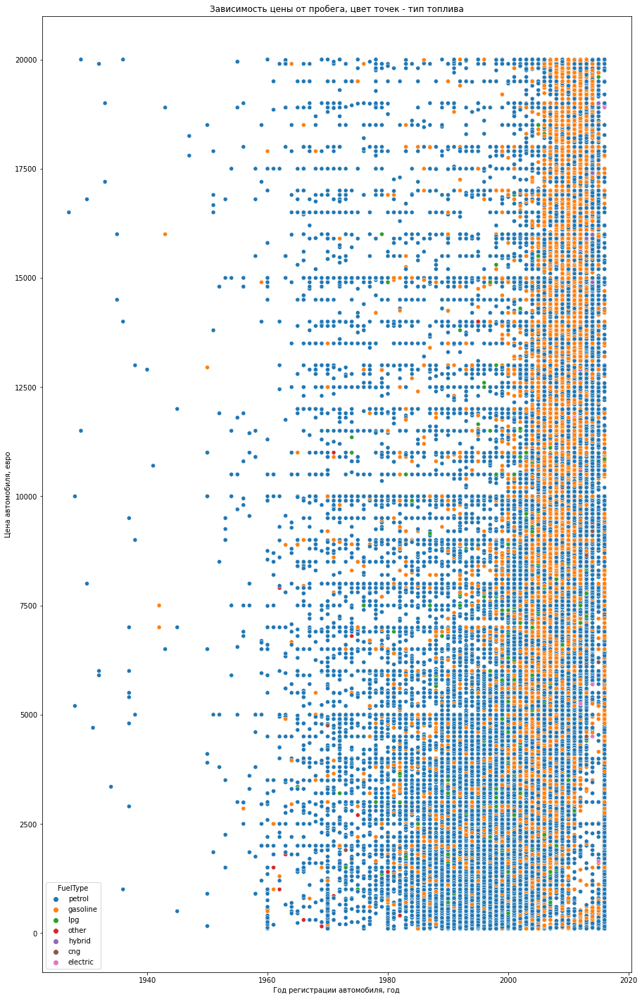

In [124]:
ax, fig = plt.subplots(figsize=(15,25))
sns.scatterplot(data=df, x='RegistrationYear', y='Price', hue='FuelType');
plt.xlabel('Год регистрации автомобиля, год');
plt.ylabel('Цена автомобиля, евро');
plt.title("Зависимость цены от пробега, цвет точек - тип топлива");

Как видно на диаграмме выше, среди автомобилей до 2000 года преобладает доля топлива petrol, однако начиная с 2000 года авто на топливе gasoline начинает расти. Также в соеднем автомобили с типом топлива gasoline дороже автомобилей petrol. 

Диаграмма рассеяния между признаками 'Price' и 'RegistrationYear', цвет точек диаграммы отображает признак 'Repaired'

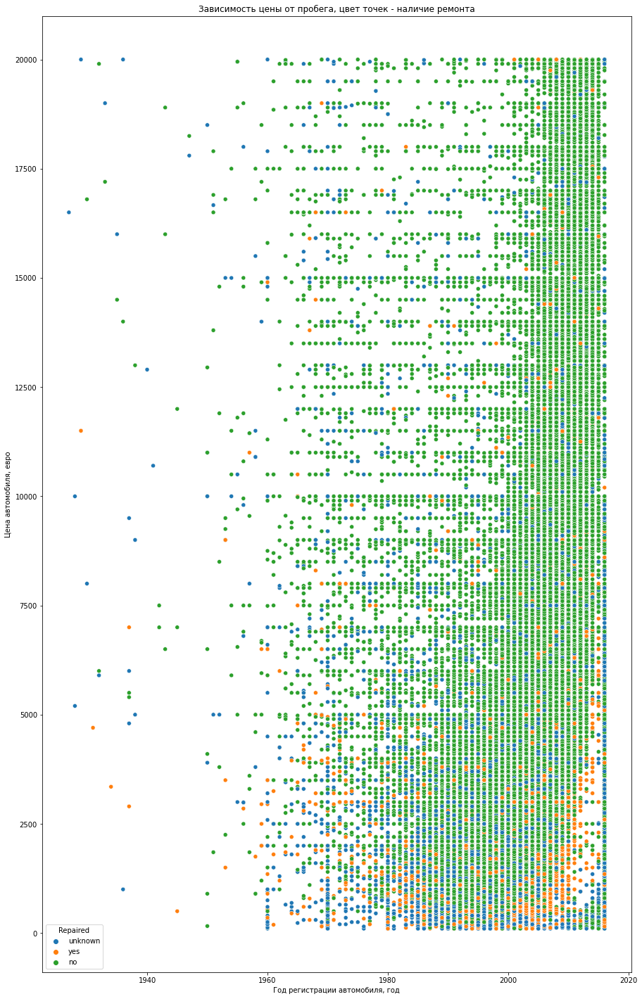

In [125]:
ax, fig = plt.subplots(figsize=(15,25))
sns.scatterplot(data=df, x='RegistrationYear', y='Price', hue='Repaired');
plt.xlabel('Год регистрации автомобиля, год');
plt.ylabel('Цена автомобиля, евро');
plt.title("Зависимость цены от пробега, цвет точек - наличие ремонта");

Как видно из графика выше, цены на автомобили с ремонтом заметно ниже, что логично. Также, можно отметить, что цены на автомобили по которым не было информации о ремонте (параметр unknown) htlrj ghtdsif.n jnvtnre d 10_000 евро.

Диаграмма рассеяния между признаками 'Price' и 'Power', цвет точек диаграммы отображает признак 'VehicleType'

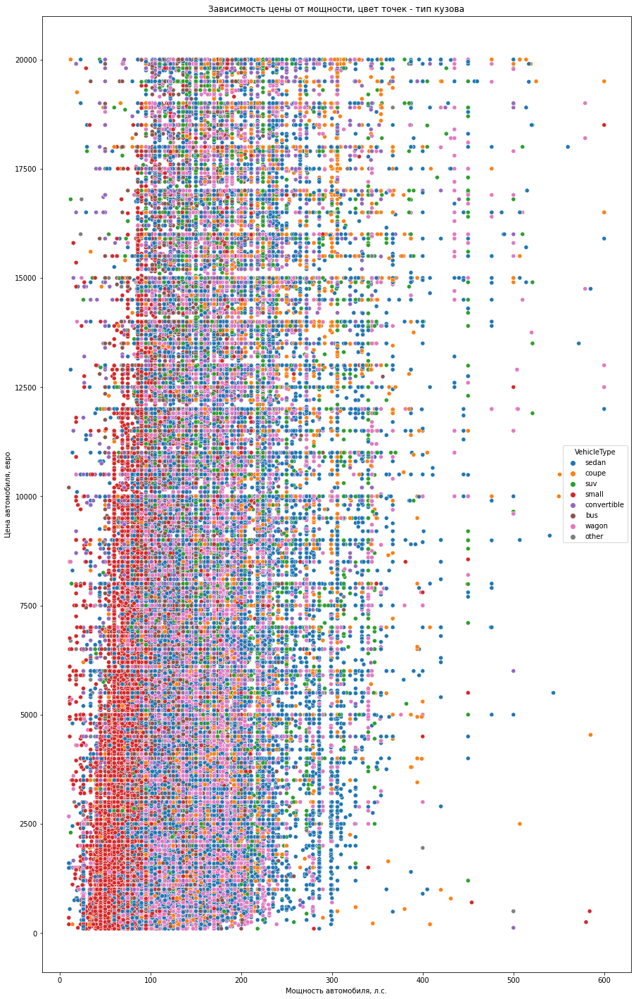

In [126]:
ax, fig = plt.subplots(figsize=(15,25))
sns.scatterplot(data=df, x='Power', y='Price', hue='VehicleType');
plt.xlabel('Мощность автомобиля, л.с.');
plt.ylabel('Цена автомобиля, евро');
plt.title("Зависимость цены от мощности, цвет точек - тип кузова");

Как видно из графика выше, имеется некая линейная зависимость между мощностью и ценой автомобиля - чем мощнее автомобиль, тем в среднем он дороже. В части распределения по типу кузова на этом графике также четко просматривается зависимость только для кузова small, видно что этот тип кузова обладает заметно меньшей мощностью, относительно автомобилей с другими типами кузова.

Диаграмма рассеяния между признаками 'Price' и 'Power', цвет точек диаграммы отображает признак 'Gearbox'

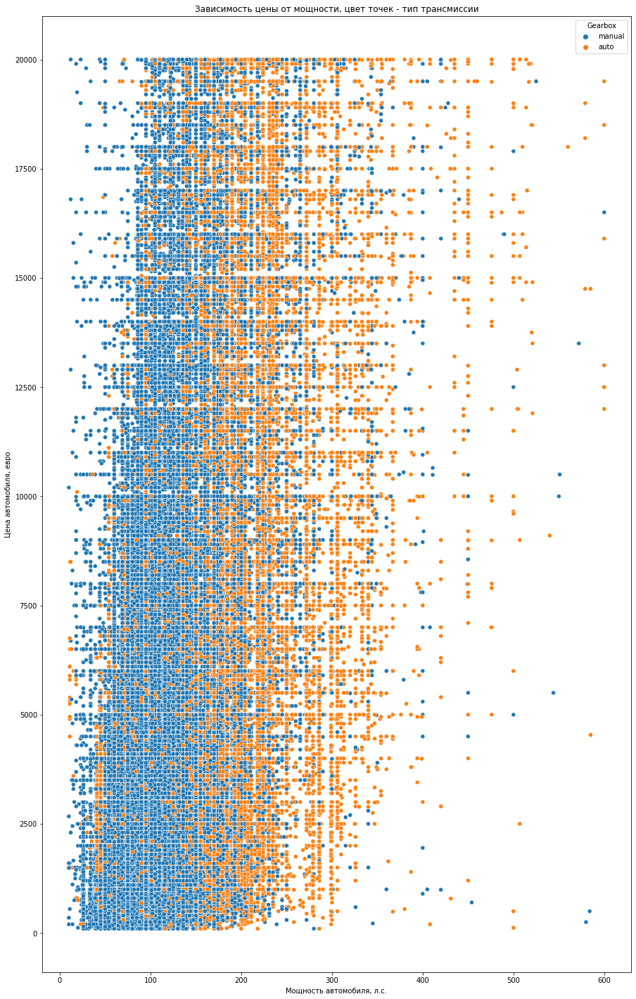

In [127]:
ax, fig = plt.subplots(figsize=(15,25))
sns.scatterplot(data=df, x='Power', y='Price', hue='Gearbox');
plt.xlabel('Мощность автомобиля, л.с.');
plt.ylabel('Цена автомобиля, евро');
plt.title("Зависимость цены от мощности, цвет точек - тип трансмиссии");

На графике выше хорошо читается зависимость типа трансмиссии от мощности автомобиля - чем мощнее автомобиль, тем с большей вероятностью он будет обладать автоматической КПП(auto), фактически для автомобилей мошностью юолее 200 л.с. характерно резкое снижение доли механической КПП(manual).

Диаграмма рассеяния между признаками 'Price' и 'Power', цвет точек диаграммы отображает признак 'FuelType'

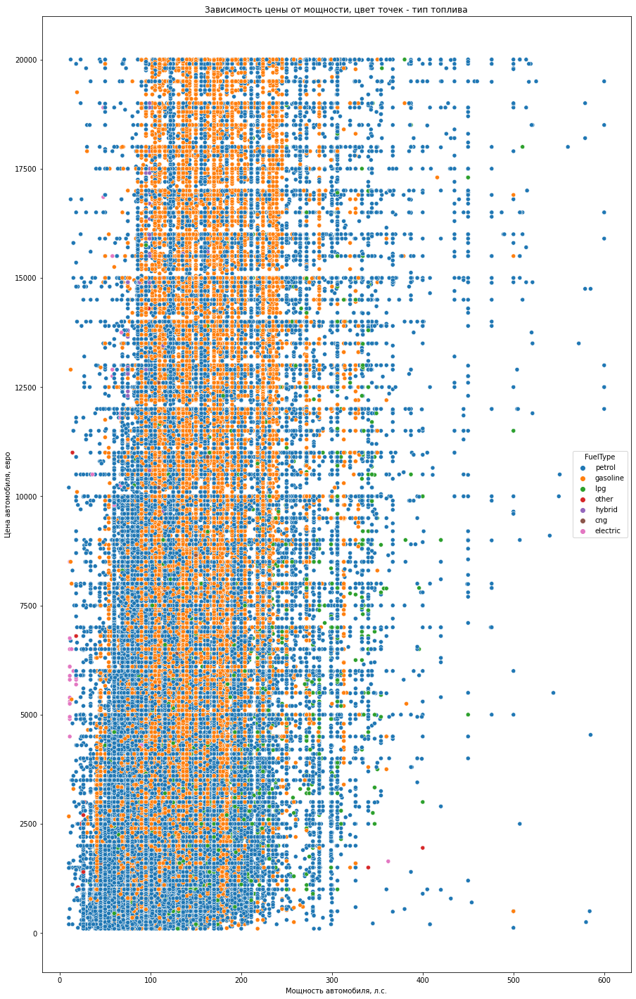

In [128]:
ax, fig = plt.subplots(figsize=(15,25))
sns.scatterplot(data=df, x='Power', y='Price', hue='FuelType');
plt.xlabel('Мощность автомобиля, л.с.');
plt.ylabel('Цена автомобиля, евро');
plt.title("Зависимость цены от мощности, цвет точек - тип топлива");

Как видно на графике выше, распределение автомоблилей по типу топлива в зависимости от мощности, имеет следующую зависимоть: для автомобилей мощностью до 100 л.с. преобладает топливо petrol, в диапазон 100-250 л.с. доля petrol и gasoline достаточно равномерна (за исключением сегмента до 2500 евро, где преобладает petrol). Для машин мощностью более 250 л.с. более характерным видом топлива является petrol.

Диаграмма рассеяния между признаками 'Price' и 'Power', цвет точек диаграммы отображает признак 'Repaired'

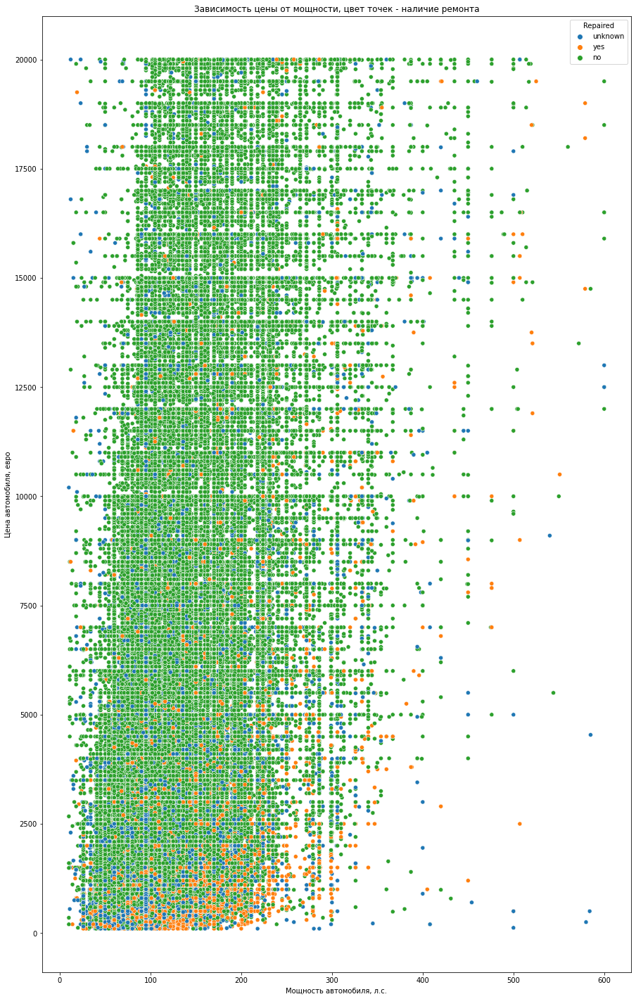

In [129]:
ax, fig = plt.subplots(figsize=(15,25))
sns.scatterplot(data=df, x='Power', y='Price', hue='Repaired');
plt.xlabel('Мощность автомобиля, л.с.');
plt.ylabel('Цена автомобиля, евро');
plt.title("Зависимость цены от мощности, цвет точек - наличие ремонта");

На диаграмме выше не просматривается четкая закономерность распределения автомобилей с ремонтом в зависимости от мощности авто (что вцелом - логично), заметно только, что в нижнем ценовом диапазоне (до 2500 евро) на отрезке 0-100 л.с. наблюдается большое количество значений unknown, тогда как на отрезке 100 - 250 л.с. в этом ценовом диапазоне больше значений yes. 

Диаграмма рассеяния между признаками 'Price' и 'Kilometer', цвет точек диаграммы отображает признак 'VehicleType'

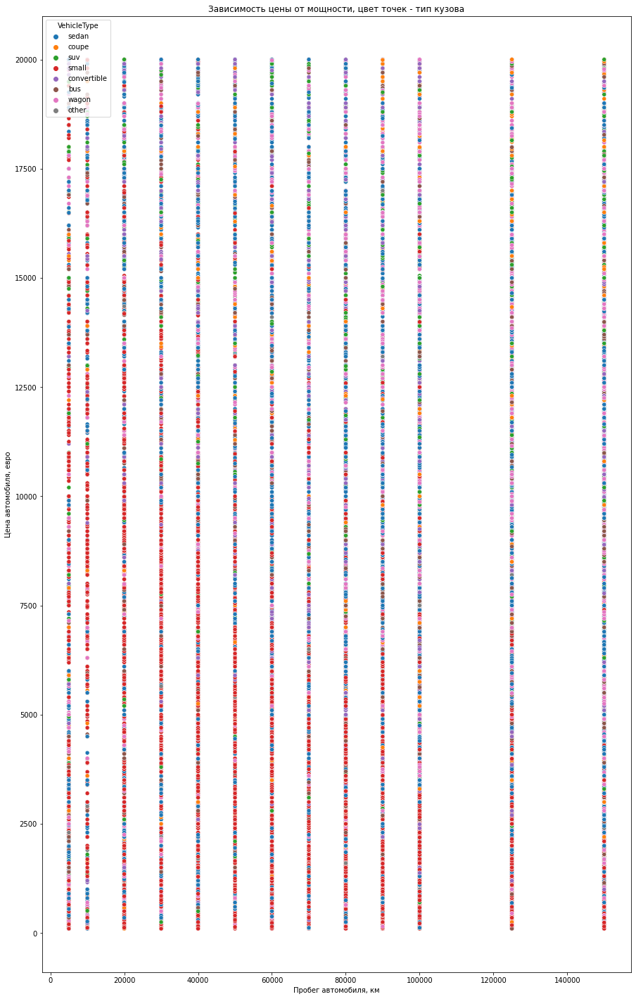

In [130]:
ax, fig = plt.subplots(figsize=(15,25))
sns.scatterplot(data=df, x='Kilometer', y='Price', hue='VehicleType');
plt.xlabel('Пробег автомобиля, км');
plt.ylabel('Цена автомобиля, евро');
plt.title("Зависимость цены от мощности, цвет точек - тип кузова");

Как видно на диаграмме выше, между ценой и пробегом автомобиля нет четкой взамосвязи (если мы не делим их по брендам и моделям). Относительно типов кузовов автомобилей, заметно, что автомобили с кузовом small, чаще имеют небольшие пробеги, чо обусловлено тем фактом, что такие  автомобили как правило используют в городе.

Диаграмма рассеяния между признаками 'Price' и 'Kilometer', цвет точек диаграммы отображает признак 'Gearbox'

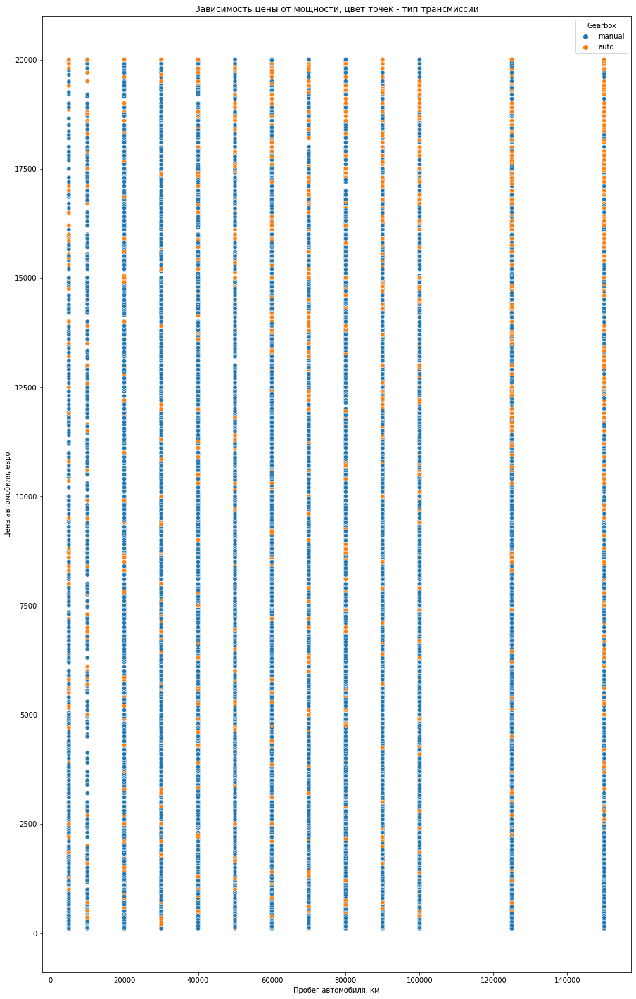

In [131]:
ax, fig = plt.subplots(figsize=(15,25))
sns.scatterplot(data=df, x='Kilometer', y='Price', hue='Gearbox');
plt.xlabel('Пробег автомобиля, км');
plt.ylabel('Цена автомобиля, евро');
plt.title("Зависимость цены от мощности, цвет точек - тип трансмиссии");

Как видно на диаграмме выше, между типом КПП авто и его пробегом нет четкой взаимосвязи (что логично), однако хорошо заметно, что в целом авто с автоматической КПП(auto), дороже "механики"(manual).

Диаграмма рассеяния между признаками 'Price' и 'Kilometer', цвет точек диаграммы отображает признак 'FuelType'

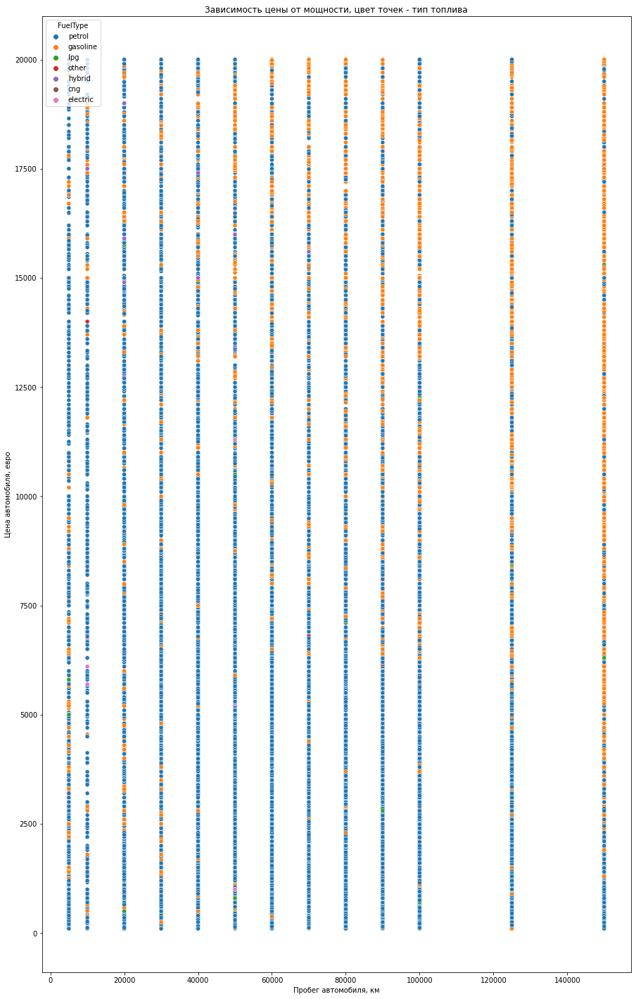

In [132]:
ax, fig = plt.subplots(figsize=(15,25))
sns.scatterplot(data=df, x='Kilometer', y='Price', hue='FuelType');
plt.xlabel('Пробег автомобиля, км');
plt.ylabel('Цена автомобиля, евро');
plt.title("Зависимость цены от мощности, цвет точек - тип топлива");

Как видно из диаграммы выше, небольшие пробеги более характерны для автомобилей с типом топлива petrol, тогда как авто с пробегом более 100_000 км, чаще имею тип топлива gasoline.

Диаграмма рассеяния между признаками 'Price' и 'Kilometer', цвет точек диаграммы отображает признак 'Repaired'

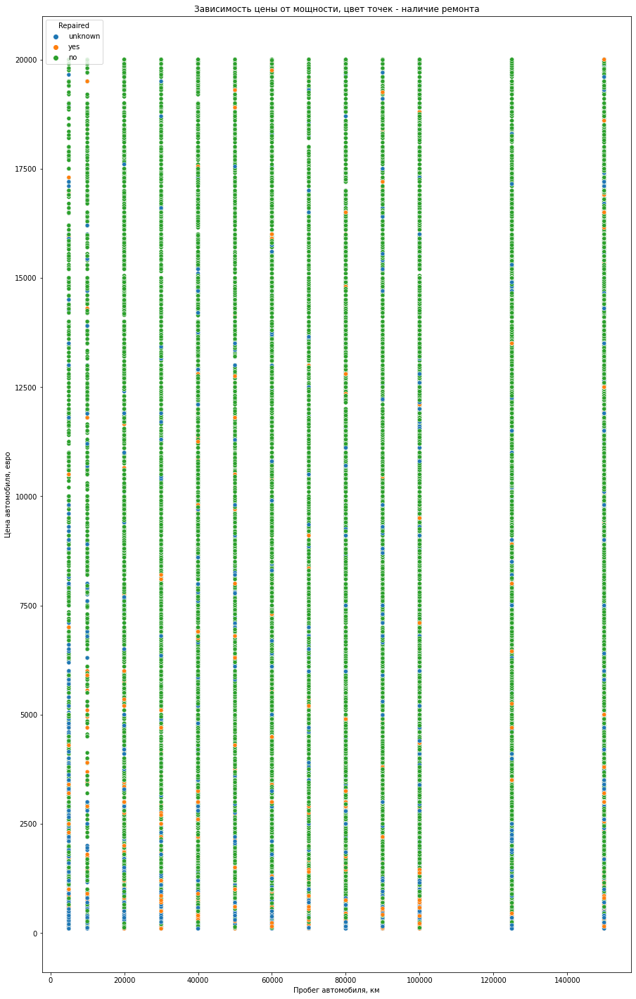

In [133]:
ax, fig = plt.subplots(figsize=(15,25))
sns.scatterplot(data=df, x='Kilometer', y='Price', hue='Repaired');
plt.xlabel('Пробег автомобиля, км');
plt.ylabel('Цена автомобиля, евро');
plt.title("Зависимость цены от мощности, цвет точек - наличие ремонта");

На диаграмме выше не выявлено четких зависимостей между пробегом и наличием ремонта, хотя для машин пробегами более 100_000 значения yes как будто бы встречабтся реже, чем должно было быть, однако масштаб графика не позволяет делать четких выводов, т.к. плотность объектов по этим значениям очень велика

Диаграмма рассеяния между признаками 'Price' и 'RegistrationMonth', цвет точек диаграммы отображает признак 'VehicleType'

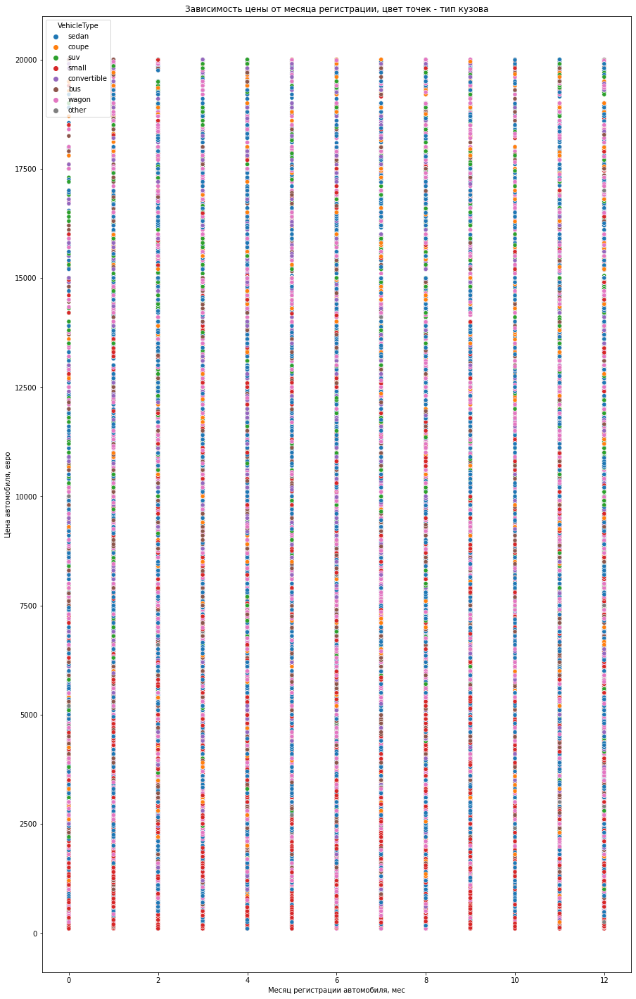

In [134]:
ax, fig = plt.subplots(figsize=(15,25))
sns.scatterplot(data=df, x='RegistrationMonth', y='Price', hue='VehicleType');
plt.xlabel('Месяц регистрации автомобиля, мес');
plt.ylabel('Цена автомобиля, евро');
plt.title("Зависимость цены от месяца регистрации, цвет точек - тип кузова");

Как видно из диаграммы выше, сложно сделать какие-то выводы о зависимости как цены автомобиля, так и типа автомобиля от месяца его регистрации, кроме как, что автомобили имеющие аномальный параметр месяца регистрации - 0, реже имеют стоимость более 15_000 евро, по сравнению с авто, зарегистрированными в реальном диапазоне.

Диаграмма рассеяния между признаками 'Price' и 'RegistrationMonth', цвет точек диаграммы отображает признак 'Gearbox'

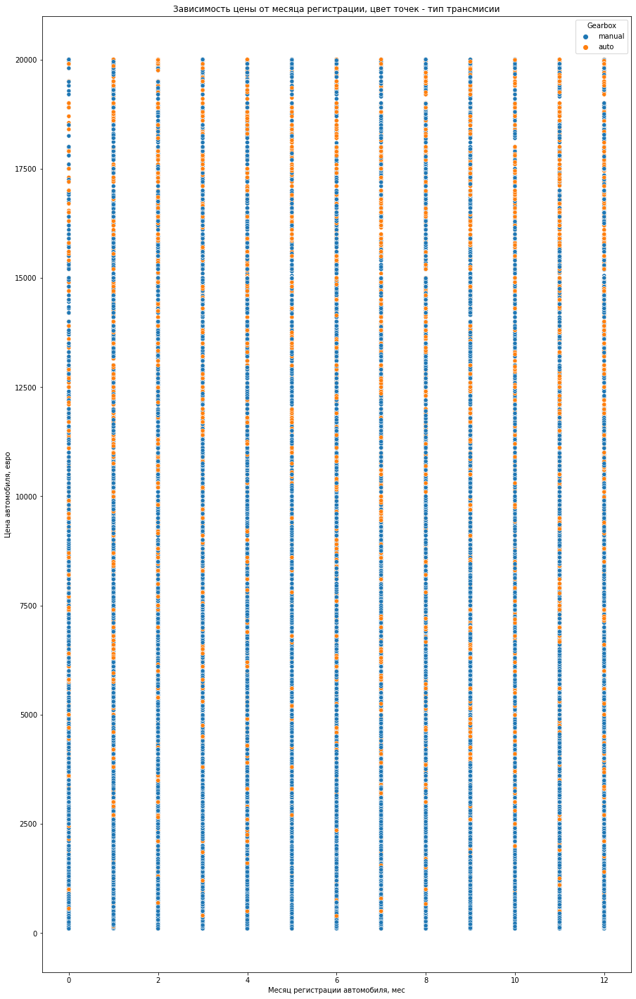

In [135]:
ax, fig = plt.subplots(figsize=(15,25))
sns.scatterplot(data=df, x='RegistrationMonth', y='Price', hue='Gearbox');
plt.xlabel('Месяц регистрации автомобиля, мес');
plt.ylabel('Цена автомобиля, евро');
plt.title("Зависимость цены от месяца регистрации, цвет точек - тип трансмисии");

Как видно из диаграммы выше, сложно сделать какие-то выводы о зависимости распределения типа трансмиссии авто, от месяца его регистрации.

Диаграмма рассеяния между признаками 'Price' и 'RegistrationMonth', цвет точек диаграммы отображает признак 'FuelType'

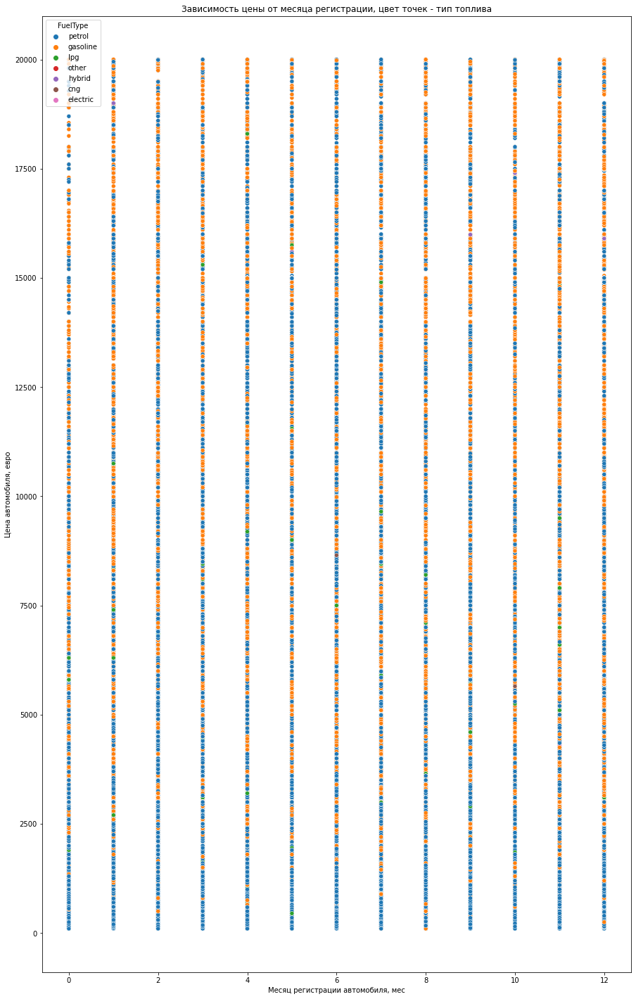

In [136]:
ax, fig = plt.subplots(figsize=(15,25))
sns.scatterplot(data=df, x='RegistrationMonth', y='Price', hue='FuelType');
plt.xlabel('Месяц регистрации автомобиля, мес');
plt.ylabel('Цена автомобиля, евро');
plt.title("Зависимость цены от месяца регистрации, цвет точек - тип топлива");

Как видно из диаграммы выше, сложно сделать какие-то выводы о зависимости распределения типа трансмиссии авто, от месяца его регистрации.

Диаграмма рассеяния между признаками 'Price' и 'RegistrationMonth', цвет точек диаграммы отображает признак 'Repaired'

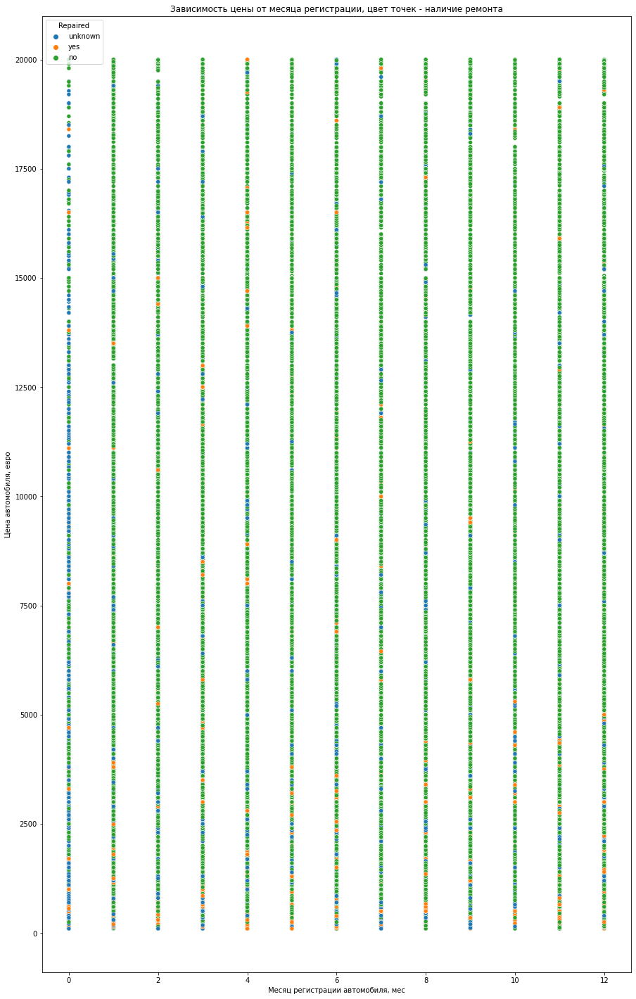

In [137]:
ax, fig = plt.subplots(figsize=(15,25))
sns.scatterplot(data=df, x='RegistrationMonth', y='Price', hue='Repaired');
plt.xlabel('Месяц регистрации автомобиля, мес');
plt.ylabel('Цена автомобиля, евро');
plt.title("Зависимость цены от месяца регистрации, цвет точек - наличие ремонта");

Как видно из диаграммы выше, автомобили имеющие аномальный параметр месяца регистрации - 0, гораздо чаще не имеют информации о проведенном ремонте авто(параметр unknown), по сравнению с автомобилями, зарегистрированными в реальном диапазоне.

**Вывод:** Загружены необходимые для выполнения исследования данные, выявдены имеющиеся в датасете пропуски. Пропуски в параметре Model отнесены к серии  other, параметры VehicleType, Gearbox и FuelType восстановдены максимальными значениями данных параметров по объектам с аналогичными показателями  Brand, Model и Power. Пропуски в параметре Repaired заменены на заглушку unknown. Также в датасете выявлены 4 неявных дубликата, которые были удалены. Проведен исследовательский анализ данных в процессе которого были удалены объекты с аномальными значениями Price, Power, RegisrationYear. Сформирована матрица корреляции входных признаков с целевым и между собой. Признаки  DateCrawled, DateCreated, NumberOfPictures, PostalCode, LastSeen удалены как неинформативные. Сформированы графики рассеяния входных признаков с целевым. Условно линейна зависимость с целевым признаком есть у признаков RegistrationYear и Power.

После удаления всех неинформативных для обучения модели признаков, выполним повторную проверку на наличие явных дубликатов в изучаемом датасете:

In [138]:
df.duplicated().sum()

26863

Количество дубликатов значительно, однако ввиду того, что они не повышают обобщающую способность модели, удалим их из датасета:

In [139]:
df = df.drop_duplicates().reset_index(drop=True)

Проверим что удаление прошло успешно:

In [140]:
df.duplicated().sum()

0

## Обучение моделей

Разделим датасет на датасеты с входными (X) и целевым (y) признаками:

In [141]:
X = df.drop(['Price'],  axis=1)
y = df['Price']

Выполним все необходимые операции по подготовке датасета к обучению: разделение на обучающую и тренировочную выборки, масштабирование количественных признаков с помощью StandardScaler() и кодирование количественных признаков с помощью OheHotEncoder():

In [142]:
X_train, X_test_valid, y_train, y_test_valid = train_test_split(
    X,
    y,
    test_size = 0.4,
    random_state = RANDOM_STATE
 )

X_valid, X_test, y_valid, y_test = train_test_split(
    X_test_valid,
    y_test_valid,
    test_size = 0.5,
    random_state = RANDOM_STATE
 )

cat_columns = ['VehicleType', 'Gearbox', 'Model', 'FuelType', 'Brand', 'Repaired']
num_columns = ['RegistrationYear', 'Power',  'Kilometer', 'RegistrationMonth']
    
# Отмасштабируем количественные параметры тренировочной и тестовой выборки, 
# с помощью метода стандартизации StandardScaler:
scaler = StandardScaler()
Scaler = scaler.fit(X_train[num_columns])
X_train_scaled_1 = Scaler.fit_transform(X_train[num_columns])
X_valid_scaled_1 = Scaler.transform(X_valid[num_columns])
X_test_scaled_1 = Scaler.transform(X_test[num_columns])
    
# Закодируем количественные признаки тренировочной и тестовой выборки, с помощью метода OneHotEncoder:
encoder = OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False)
Encoder = encoder.fit(X_train[cat_columns])
X_train_ohe = encoder.transform(X_train[cat_columns])
X_valid_ohe = encoder.transform(X_valid[cat_columns])
X_test_ohe = encoder.transform(X_test[cat_columns])
    
# Запишем полученные столбцы с закодированными значениями в переменную encoder_col_names:
encoder_cat_columns = encoder.get_feature_names_out()
    
# Создадим тренировочный и тестовый датасет из отмасштабированных данных:
X_train_scaled = pd.DataFrame(X_train_scaled_1, columns=num_columns)
X_valid_scaled = pd.DataFrame(X_valid_scaled_1, columns=num_columns)
X_test_scaled = pd.DataFrame(X_test_scaled_1, columns=num_columns)
    
# Создадим тренировочный и тестовый датасет из закодированных данных:
X_train_ohe = pd.DataFrame(X_train_ohe, columns=encoder_cat_columns)
X_valid_ohe = pd.DataFrame(X_valid_ohe, columns=encoder_cat_columns)
X_test_ohe = pd.DataFrame(X_test_ohe, columns=encoder_cat_columns)
    
# Создадим объединенный датасет из отмасштабированных и закодированных данных:
X_train = pd.concat([X_train_scaled, X_train_ohe], axis=1)
X_valid = pd.concat([X_valid_scaled, X_valid_ohe], axis=1)
X_test = pd.concat([X_test_scaled, X_test_ohe], axis=1)

**Линейная регрессия**

Выполним обучение модели линейной регрессии, на подготовленных данных:

In [143]:
%%time
# Инициализируем модель линейной регресии:
model = LinearRegression()
    
# Обучим модель на тренировочных данных:
model.fit(X_train, y_train);

CPU times: user 13.2 s, sys: 4.67 s, total: 17.9 s
Wall time: 17.9 s


LinearRegression()

Время обучения линейной модели заняло около 18 секунд, что довольно таки долго

In [144]:
%%time
# Получим прогнозные значения модели:
predictions = model.predict(X_valid)

CPU times: user 92.7 ms, sys: 107 ms, total: 200 ms
Wall time: 199 ms


Время предсказания линейной модели заняло около 170 миллисекунд.

Выведем метрики по предсказаннам моделью значениям:

In [145]:
# Для оценки качества модели посчитаем коэффициент детерминации R2 для истинных и предсказанных значений:
r2 = r2_score(y_valid, predictions)
mse = mean_squared_error(y_valid, predictions)
rmse = mean_squared_error(y_valid, predictions, squared=False)
msa = mean_absolute_error(y_valid, predictions)

print('r2:', r2, 'MSE:', mse, 'RMSE:', rmse, 'MSA:', msa)

r2: 0.6619390330390749 MSE: 6976549.395452361 RMSE: 2641.315845455132 MSA: 1849.8319260728374


Метрика RMSE = 2641, что соответствует требованию RMSE < 2700, однако модель достаточно долго обучается, что скорее всего происходит из за того, что при кодировании категориальных признаков с помощью OneHotEncoder, получается слишком много входных признаков.

**LGBMRegressor**

Выполним обучение модели бустинга с помощью модели LGBMRegressor

In [146]:
cat_columns = ['VehicleType', 'Gearbox', 'Model', 'FuelType', 'Brand', 'Repaired']
for c in cat_columns:
    X[c] = X[c].astype('category')

In [147]:
X_train, X_test_valid, y_train, y_test_valid = train_test_split(
    X,
    y,
    test_size = 0.4,
    random_state = RANDOM_STATE
 )


X_valid, X_test, y_valid, y_test = train_test_split(
    X_test_valid,
    y_test_valid,
    test_size = 0.5,
    random_state = RANDOM_STATE
 )

X_train = X_train.reset_index(drop=True)
X_valid = X_valid.reset_index(drop=True)
X_test = X_test.reset_index(drop=True)

num_columns = ['RegistrationYear', 'Power',  'Kilometer', 'RegistrationMonth']


    
# Отмасштабируем количественные параметры тренировочной и тестовой выборки, 
# с помощью метода стандартизации StandardScaler:
scaler = StandardScaler()
Scaler = scaler.fit(X_train[num_columns])
X_train_scaled_1 = Scaler.fit_transform(X_train[num_columns])
X_valid_scaled_1 = Scaler.transform(X_valid[num_columns])
X_test_scaled_1 = Scaler.transform(X_test[num_columns])


X_train = X_train.reset_index(drop=True)
    
# Создадим тренировочный и тестовый датасет из отмасштабированных данных:
X_train_scaled = pd.DataFrame(X_train_scaled_1, columns=num_columns)
X_valid_scaled = pd.DataFrame(X_valid_scaled_1, columns=num_columns)
X_test_scaled = pd.DataFrame(X_test_scaled_1, columns=num_columns)
  

# Создадим объединенный датасет из отмасштабированных и закодированных данных:
X_train = pd.concat([X_train_scaled, X_train[cat_columns]], axis=1)
X_valid = pd.concat([X_valid_scaled, X_valid[cat_columns]], axis=1)
X_test = pd.concat([X_test_scaled, X_test[cat_columns]], axis=1)

Выполним обучение модели бустинга с помощью модели LGBMRegressor

In [148]:
%%time
# Инициализируем модель бустинга LGBM
model = LGBMRegressor(n_estimators=100)
# Обучим модель на тренировочных данных:
model.fit(X_train, y_train);

CPU times: user 7.91 s, sys: 102 ms, total: 8.01 s
Wall time: 8.02 s


LGBMRegressor()

Время обучения модели составляет около 8 секунд, при количестве деревьев - 100

In [149]:
%%time
# Получим прогнозные значения модели:
predictions = model.predict(X_valid)

CPU times: user 672 ms, sys: 7.01 ms, total: 679 ms
Wall time: 711 ms


Время предсказания модели составляет около 600 миллисекунд, при количестве деревьев - 100

Выведем метрики по предсказаннам моделью значениям:

In [150]:
# Для оценки качества модели посчитаем коэффициент детерминации R2 для истинных и предсказанных значений:
r2 = r2_score(y_valid, predictions)
mse = mean_squared_error(y_valid, predictions)
rmse = mean_squared_error(y_valid, predictions, squared=False)
msa = mean_absolute_error(y_valid, predictions)

print('r2:', r2, 'MSE:', mse, 'RMSE:', rmse, 'MSA:', msa)

r2: 0.8727916143374924 MSE: 2625193.8934814003 RMSE: 1620.245010324488 MSA: 1008.3493559233401


Как видно из результатов работы модели выше, время обучения модели LGBMRegressor ощутимо быстрее времени обучения модели линейной регресии. Также, несмотря на то, что в относительных величинах время предсказания модели LGBMRegressor существенно проигрывает, оно является приемлимым в рамках абсолютной величины. Итоговая же метрика значительно улучшилась и составляет RMSE = 1620, при количестве деревьев равном 100,  что соответствует требованию RMSE < 2700.

**CatBoostRegressor**

Выполним обучение модели бустинга с помощью модели CatBoostRegressor

In [151]:
cat_columns = ['VehicleType', 'Gearbox', 'Model', 'FuelType', 'Brand', 'Repaired']
for c in cat_columns:
    X[c] = X[c].astype('str')

In [152]:
X_train, X_test_valid, y_train, y_test_valid = train_test_split(
    X,
    y,
    test_size = 0.4,
    random_state = RANDOM_STATE
 )


X_valid, X_test, y_valid, y_test = train_test_split(
    X_test_valid,
    y_test_valid,
    test_size = 0.5,
    random_state = RANDOM_STATE
 )

X_train = X_train.reset_index(drop=True)
X_valid = X_valid.reset_index(drop=True)
X_test = X_test.reset_index(drop=True)

num_columns = ['RegistrationYear', 'Power',  'Kilometer', 'RegistrationMonth']


    
# Отмасштабируем количественные параметры тренировочной и тестовой выборки, 
# с помощью метода стандартизации StandardScaler:
scaler = StandardScaler()
Scaler = scaler.fit(X_train[num_columns])
X_train_scaled_1 = Scaler.fit_transform(X_train[num_columns])
X_valid_scaled_1 = Scaler.transform(X_valid[num_columns])
X_test_scaled_1 = Scaler.transform(X_test[num_columns])


X_train = X_train.reset_index(drop=True)
    
# Создадим тренировочный и тестовый датасет из отмасштабированных данных:
X_train_scaled = pd.DataFrame(X_train_scaled_1, columns=num_columns)
X_valid_scaled = pd.DataFrame(X_valid_scaled_1, columns=num_columns)
X_test_scaled = pd.DataFrame(X_test_scaled_1, columns=num_columns)
  

# Создадим объединенный датасет из отмасштабированных и закодированных данных:
X_train = pd.concat([X_train_scaled, X_train[cat_columns]], axis=1)
X_valid = pd.concat([X_valid_scaled, X_valid[cat_columns]], axis=1)
X_test = pd.concat([X_test_scaled, X_test[cat_columns]], axis=1)

In [153]:
%%time
# Инициализируем модель бустинга CatBoost
model = (
    CatBoostRegressor(silent=True, iterations=150, 
                      cat_features = ['VehicleType', 'Gearbox', 'Model', 'FuelType', 'Brand', 'Repaired'])
)
# Обучим модель на тренировочных данных:
model.fit(X_train, y_train);

CPU times: user 9.81 s, sys: 155 ms, total: 9.96 s
Wall time: 11.7 s


Время обучения модели составляет около 10,0 секунд, при количестве итераций - 150

In [154]:
%%time
# Получим прогнозные значения модели:
predictions = model.predict(X_valid)

CPU times: user 131 ms, sys: 46 µs, total: 131 ms
Wall time: 128 ms


Время предсказания модели составляет около 120 миллисекунд, при количестве итераций - 50

Выведем метрики по предсказаннам моделью значениям:

In [155]:
# Для оценки качества модели посчитаем коэффициент детерминации R2 для истинных и предсказанных значений:
r2 = r2_score(y_valid, predictions)
mse = mean_squared_error(y_valid, predictions)
rmse = mean_squared_error(y_valid, predictions, squared=False)
msa = mean_absolute_error(y_valid, predictions)

print('r2:', r2, 'MSE:', mse, 'RMSE:', rmse, 'MSA:', msa)

r2: 0.8682554207099528 MSE: 2718807.1230546464 RMSE: 1648.880566643517 MSA: 1029.8010383500527


При сравнении с результатами работы динейной регрессии, отметим, что время обучения модели CatBoostRegressor ощутимо бытсрее, а время предсказания находится практически на том же уровне, итоговая метрика при этом существенно лучше и составляет RMSE = 1649, при количестве итераций равном 150, что соответствует требованию RMSE < 2700.
При сравнении результатов работы модели CatBoostRegressor с результатами модели LGBMRegressor, певая проигрывает некритично проигрывает по времени обучени, выигрывает по времени предсказания, но при этом немного проигрывает по метрике.

## Анализ моделей

По итогу обучения и предсказания стоимости подержанного автомобиля с помощью моделей LinearRegression, LGBMRegressor и CatBoostRegressor можно прийти к следующим выводам:

 - *LinearRegression* при применении кодировщика OneHotEncoder укладывалась в лимит по метрике (RMSE = 2641) с минимальным запасом и при этом обучается слишком долго (около 18 секунд). Предсказания при этом выполняются моделью быстро - около 170 мс.
 - *LGBMRegressor* обучается быстрее всех(около 8 секунд), имеет хорошую метрику (RMSE = 1620), по времени предсказания проигрывает двум другим моделям (около 600 мс). Сочетание метрика/время обучения и предсказания данной модели можно регулировать гиперпараметром n_estimators. В рамках данного исследования обучение и предсказания получали при значении  n_estimators = 100, что является гиперпараметром по умолчанию.
 - *CatBoostRegressor* обучается дольше LGBMRegressor (около 10 секунд, причем на базовых гиперпараметрах существенно дольше - время обучения более 1 минуты), предсказания выполняет быстрее LGBMRegressor (около 120 мс, но немного проигрывает в метрике (RMSE = 1649). В рамках обучения обучение и предсказание проводили на количестве итераций = 50, что дает оптимальное сочетание метрика/время обучения.
 
С учетом вышесказанного наилучшей моделью по сочетанию факторов время обучения, время работы и RMSE являтся модель LGBMRegressor, проведем тестирование данной модели, чтобы убедиться что данные результаты были достигнуты не в результате переобучения:

In [156]:
cat_columns = ['VehicleType', 'Gearbox', 'Model', 'FuelType', 'Brand', 'Repaired']
for c in cat_columns:
    X[c] = X[c].astype('category')

In [157]:
X_train, X_test_valid, y_train, y_test_valid = train_test_split(
    X,
    y,
    test_size = 0.4,
    random_state = RANDOM_STATE
 )


X_valid, X_test, y_valid, y_test = train_test_split(
    X_test_valid,
    y_test_valid,
    test_size = 0.5,
    random_state = RANDOM_STATE
 )

X_train = X_train.reset_index(drop=True)
X_valid = X_valid.reset_index(drop=True)
X_test = X_test.reset_index(drop=True)

num_columns = ['RegistrationYear', 'Power',  'Kilometer', 'RegistrationMonth']


    
# Отмасштабируем количественные параметры тренировочной и тестовой выборки, 
# с помощью метода стандартизации StandardScaler:
scaler = StandardScaler()
Scaler = scaler.fit(X_train[num_columns])
X_train_scaled_1 = Scaler.fit_transform(X_train[num_columns])
X_valid_scaled_1 = Scaler.transform(X_valid[num_columns])
X_test_scaled_1 = Scaler.transform(X_test[num_columns])


X_train = X_train.reset_index(drop=True)
    
# Создадим тренировочный и тестовый датасет из отмасштабированных данных:
X_train_scaled = pd.DataFrame(X_train_scaled_1, columns=num_columns)
X_valid_scaled = pd.DataFrame(X_valid_scaled_1, columns=num_columns)
X_test_scaled = pd.DataFrame(X_test_scaled_1, columns=num_columns)
  

# Создадим объединенный датасет из отмасштабированных и закодированных данных:
X_train = pd.concat([X_train_scaled, X_train[cat_columns]], axis=1)
X_valid = pd.concat([X_valid_scaled, X_valid[cat_columns]], axis=1)
X_test = pd.concat([X_test_scaled, X_test[cat_columns]], axis=1)

In [158]:
%%time
# Инициализируем модель бустинга LGBM
model = LGBMRegressor(n_estimators=100)
# Обучим модель на тренировочных данных:
model.fit(X_train, y_train);

CPU times: user 7.89 s, sys: 50.3 ms, total: 7.94 s
Wall time: 7.99 s


LGBMRegressor()

In [159]:
%%time
# Получим прогнозные значения модели:
predictions = model.predict(X_test)

CPU times: user 652 ms, sys: 0 ns, total: 652 ms
Wall time: 699 ms


In [160]:
# Для оценки качества модели посчитаем коэффициент детерминации R2 для истинных и предсказанных значений:
r2 = r2_score(y_test, predictions)
mse = mean_squared_error(y_test, predictions)
rmse = mean_squared_error(y_test, predictions, squared=False)
msa = mean_absolute_error(y_test, predictions)

print('r2:', r2, 'MSE:', mse, 'RMSE:', rmse, 'MSA:', msa)

r2: 0.8731272312653998 MSE: 2602367.584171784 RMSE: 1613.1855392891991 MSA: 1009.5650824193575


Как видно из результатов работы модели LGBMRegressor выше, время обучения на тестовых данных составило около 8 сек, время предсказания - около 600 мс, итоговая метрика  RMSE = 1613 . Данные результаты существенно не отличаются от результатов на валидационной выборке, что говорит о корректной работе алгоритма

**Вывод:** Наилучшей моделью по сочетанию факторов время обучения, время работы и RMSE являтся модель LGBMRegressor, т.к. имеет лучшую метрику и быстрее всех обучается. Несмотря на то, что модель дольше всех делает предсказание, в аюсолютной величине 600 мс видится весьма приемлимым быстродействием. 

## Анализ моделей

**Общий вывод:** Сервис по продаже автомобилей с пробегом «Не бит, не крашен» в рамках разработки приложения для привлечения новых клиентов обратился с задачей по предсказанию рыночную стоимости автомобиля пользователя. В качестве исходных данных сервис передал исторические данные: технические характеристики, комплектации и цены автомобилей. Цель работы - построить модель для определения стоимости. 

Заказчику важны:
- качество предсказания;
- скорость предсказания;
- время обучения.

В рамках подготовки к обучению моделей, были загружены необходимые для выполнения исследования данные, выявлены имеющиеся в датасете пропуски. Пропуски в параметре Model отнесены к серии  other, параметры VehicleType, Gearbox и FuelType восстановдены максимальными значениями данных параметров по объектам с аналогичными показателями  Brand, Model и Power. Пропуски в параметре Repaired заменены на заглушку unknown. Также в датасете выявлены 4 неявных дубликата, которые были удалены. Проведен исследовательский анализ данных в процессе которого были удалены объекты с аномальными значениями Price, Power, RegisrationYear. Сформирована матрица корреляции входных признаков с целевым и между собой. Признаки  DateCrawled, DateCreated, NumberOfPictures, PostalCode, LastSeen удалены как неинформативные. Сформированы графики рассеяния входных признаков с целевым. Условно линейна зависимость с целевым признаком есть у признаков RegistrationYear и Power.

Обучение и предсказание цевеого параметра выполнялось на базе трех моделей:
- LinearRegression 
- LGBMRegressor 
- CatBoostRegressor

По итогу обучения и предсказания стоимости подержанного автомобиля с помощью моделей LinearRegression, LGBMRegressor и CatBoostRegressor можно прийти к следующим выводам:

 - *LinearRegression* при применении кодировщика OneHotEncoder укладывалась в лимит по метрике (RMSE = 2641) с минимальным запасом и при этом обучается слишком долго (около 18 секунд). Предсказания при этом выполняются моделью быстро - около 170 мс.
 - *LGBMRegressor* обучается быстрее всех(около 7 секунд), имеет хорошую метрику (RMSE = 1620), по времени предсказания проигрывает двум другим моделям (около 600 мс). Сочетание метрика/время обучения и предсказания данной модели можно регулировать гиперпараметром n_estimators. В рамках данного исследования обучение и предсказания получали при значении  n_estimators = 100, что является гиперпараметром по умолчанию.
 - *CatBoostRegressor* обучается дольше LGBMRegressor (около 10 секунд, причем на базовых гиперпараметрах существенно дольше - время обучения более 1 минуты), предсказания выполняет быстрее LGBMRegressor (около 120 мс, но немного проигрывает в метрике (RMSE = 1649). В рамках обучения обучение и предсказание проводили на количестве итераций = 50, что дает оптимальное сочетание метрика/время обучения.
 
С учетом вышесказанного, наилучшей моделью по сочетанию факторов время обучения, время работы и RMSE была признана модель LGBMRegressor, было проведено тестирование данной модели, чтобы убедиться что данные результаты были достигнуты не в результате переобучения.

По результату работы лучшей модели на тестовых данных время обучения составило около 8 сек, время предсказания - около 600 мс, итоговая метрика  RMSE = 1613 . Данные результаты существенно не отличаются от результатов на валидационной выборке, что говорит о корректной работе алгоритма.



По итогу проведенного исследования наилучшей моделью по сочетанию факторов время обучения, время работы и RMSE являтся модель LGBMRegressor, т.к. имеет лучшую метрику и быстрее всех обучается. Несмотря на то, что модель дольше всех делает предсказание, в абсолютной величине 600 мс видится весьма приемлимым быстродействием. Модель может быть рекомендована Заказчику 

## Чек-лист проверки

Поставьте 'x' в выполненных пунктах. Далее нажмите Shift+Enter.

- [x]  Jupyter Notebook открыт
- [ ]  Весь код выполняется без ошибок
- [x]  Ячейки с кодом расположены в порядке исполнения
- [x]  Выполнена загрузка и подготовка данных
- [x]  Выполнено обучение моделей
- [x]  Есть анализ скорости работы и качества моделей